In [1]:
expt_names = ["derek_d1_abhishek_offline_2024-09-26-1419_Rhythm-Game-Typing-Task"] # data file to read from

In [50]:
import ast
import numpy as np
import os

from src.data.key_dataset import KeyDataset
from src.data.utils import load_data
from src.data.filter import Filter

import operator
from functools import reduce

In [3]:
rhythm_layout = ['a', 's', 'd', 'f']
binary_layout = [0, 1]
right_layout = ['j', 'k', 'l', ';']
six_finger_layout = ['a', 's', 'd', 'f', 'g', 'h']
new_layout = ['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h']
two_fingers_layout = ['g', 'h']
window_pre = 800 #//2
window_post = 800 #//2
subwindow_len = 480 #//2

In [99]:
parent_dir = os.path.dirname(os.getcwd())
data_dir = parent_dir + "/data/"
expt_list = expt_names
layout = new_layout
filter_params = None

def get_data(expt_list, layout, filter_params=None):
    datasets = []

    for expt_name in expt_list:
        key_fname = data_dir + expt_name + "/data_streams/key_stream.bin"
        emg_fname = data_dir + expt_name + "/data_streams/emg_stream.bin"
        key_data = load_data(key_fname)
        emg_data = load_data(emg_fname)
        emg_names = ['emgbuffer'] + list(emg_data.dtype.names)[1:]
        key_names = ['keybuffer'] + list(key_data.dtype.names)[1:]
        emg_data.dtype.names = emg_names
        key_data.dtype.names = key_names
        print([chr(i) for i in key_data['keybuffer'][:80, 1]])
        
#         print(emg_data.shape)
#         for i in range(0, 100):
#            print(emg_data[i][-1])
        new_key_data = np.zeros(key_data.size, 
                                dtype=[('keybuffer', '<i8', (3,)), ('emg_stream_step', '<i8'), ('key_stream_step', '<i8'), ('time_ns', '<i8')])
        new_key_data['keybuffer'] = np.concatenate((np.zeros_like(key_data['keybuffer'][:, 1:2]), 
                                                key_data['keybuffer']), axis=1)
        new_key_data['emg_stream_step'] = key_data['emg_stream_step']
        new_key_data['key_stream_step'] = key_data['key_stream_step']
        new_key_data['time_ns'] = key_data['time_ns']

        emg_stream = emg_data['emgbuffer']
        
        
        
#         for i in new_key_data:
#            if(i[0][1] != 0):
#                print(i)
        
        dataset = KeyDataset(emg_stream, new_key_data, layout, window_pre, window_post, subwindow_len,
                             start_channel=1, 
                             end_channel=65, bipolar=False, avg_ref=True, binary=True, 
                             include_blanks=True, 
                             limit_blanks=False,
                             filter_params=filter_params)

        datasets.append(dataset)
    full = reduce(operator.add, datasets)
    full.print_counts()
    data = full.to_numpy(include_full_windows=True)
    return data

In [100]:
#fs = 2000.0
#filter_params = {'fs': fs, 'fc': (10, min(1000.0, 0.5*fs - 1))}
fs = 4000.0
filter_params = None
print(filter_params)
data = get_data(expt_names, new_layout,filter_params=filter_params)
print(data.dtype)

None
['a', 'a', 'e', 'h', 'd', 'a', 'g', 'h', 'b', 'f', 'e', 'b', 'g', 'b', 'g', 'g', 'b', 'b', 'g', 'f', 'e', 'f', 'g', 'h', 'a', 'g', 'a', 'a', 'a', 'h', 'b', 'f', 'a', 'b', 'a', 'h', 'd', 'g', 'f', 'h', 'h', 'g', 'b', 'd', 'f', 'h', 'd', 'b', 'e', 'h', 'h', 'f', 'h', 'g', 'b', 'b', 'e', 'a', 'd', 'd', 'd', 'e', 'f', 'f', 'g', 'g', 'f', 'd', 'h', 'b', 'b', 'g', 'f', 'a', 'g', 'b', 'g', 'f', 'd', 'f']
0.0, NULL: 2097
1.0, : 699
[('full_windows', '<f8', (1600, 64)), ('emg_windows', '<f8', (480, 64)), ('start_idxs', '<i8'), ('key_label', '<f8')]


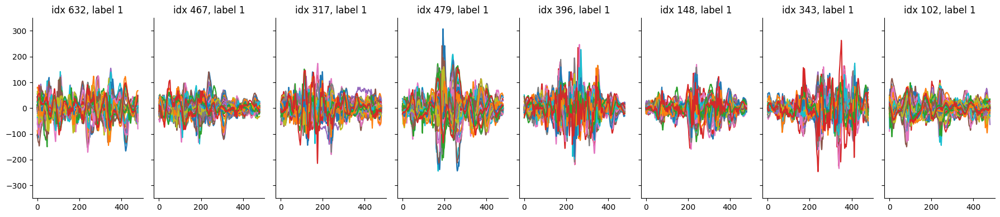

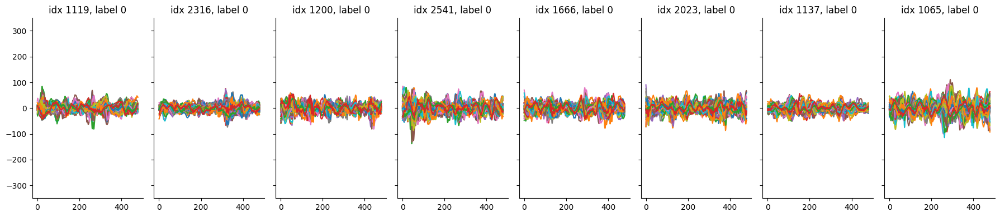

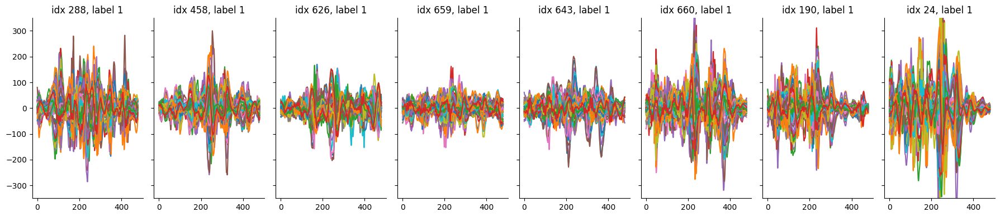

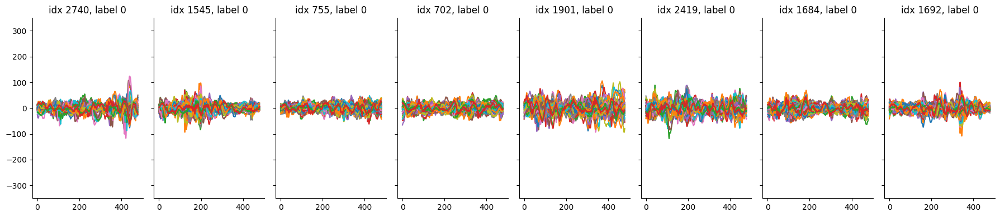

In [101]:
import numpy as np

import matplotlib.pyplot as plt

def plot_random_emg_windows(data, lower_bound, upper_bound):
    """
    Plots the EMG windows for 8 random indexes between the given lower and upper bounds.
    
    :param data: The data containing 'emg_windows'.
    :param lower_bound: The lower bound for the random integer selection.
    :param upper_bound: The upper bound for the random integer selection.
    """
    # Generate 8 random integers between lower_bound and upper_bound
    random_indexes = np.random.randint(lower_bound, upper_bound, 8)
    
    # Create a figure with 8 subplots in a single row # share x and y axis
    fig, axes = plt.subplots(1, 8, figsize=(18, 4), sharex=True, sharey=True)
    
    # Plot each selected EMG window in a subplot
    for i, idx in enumerate(random_indexes):
        ax = axes[i]
        ax.plot(data['emg_windows'][idx])
        ax.set_title(f"idx {idx}, label {int(data['key_label'][idx])}")
        # ax.set_xlabel('Time Points')
        # ax.set_ylabel('Amplitude')
        # set y axis limits to be the same for all subplots
        ax.set_ylim(-350, 350)
        # Remove the borders
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        # ax.spines['bottom'].set_visible(False)
        # ax.spines['left'].set_visible(False)
    
    # Adjust layout to prevent overlap
    plt.tight_layout()
    plt.show()


plot_random_emg_windows(data, 0, 699)
plot_random_emg_windows(data, 699, data['emg_windows'].shape[0])
plot_random_emg_windows(data, 0, 699)
plot_random_emg_windows(data, 699, data['emg_windows'].shape[0])

In [97]:
# parent_dir = os.path.dirname(os.getcwd())
# data_dir = parent_dir + "/data/"
# expt_list = expt_names
# layout = new_layout
# filter_params = None

# ### function get data
# datasets = []
# for expt_name in expt_list:
#     key_fname = data_dir + expt_name + "/data_streams/key_stream.bin"
#     emg_fname = data_dir + expt_name + "/data_streams/emg_stream.bin"
#     key_data = load_data(key_fname)
#     emg_data = load_data(emg_fname)
#     emg_names = ['emgbuffer'] + list(emg_data.dtype.names)[1:]
#     key_names = ['keybuffer'] + list(key_data.dtype.names)[1:]
#     emg_data.dtype.names = emg_names
#     key_data.dtype.names = key_names
#     # print([chr(i) for i in key_data['keybuffer'][:80, 1]])

#     new_key_data = np.zeros(key_data.size, 
#                             dtype=[('keybuffer', '<i8', (3,)), ('emg_stream_step', '<i8'), ('key_stream_step', '<i8'), ('time_ns', '<i8')])
#     new_key_data['keybuffer'] = np.concatenate((np.zeros_like(key_data['keybuffer'][:, 1:2]), 
#                                             key_data['keybuffer']), axis=1)
#     new_key_data['emg_stream_step'] = key_data['emg_stream_step']
#     new_key_data['key_stream_step'] = key_data['key_stream_step']
#     new_key_data['time_ns'] = key_data['time_ns']

#     emg_stream = emg_data['emgbuffer']

#     dataset = KeyDataset(emg_stream, new_key_data, layout, window_pre, window_post, subwindow_len,
#                          start_channel=1,
#                          end_channel=65, bipolar=False, avg_ref=True, binary=True,
#                          include_blanks=True,
#                          limit_blanks=False,
#                          filter_params=filter_params)
    
#     datasets.append(dataset)

# full = reduce(operator.add, datasets)
# full.print_counts()
# data = full.to_numpy(include_full_windows=True)


In [56]:
y = data['emg_windows']

In [57]:
y.shape

(2796, 480, 64)

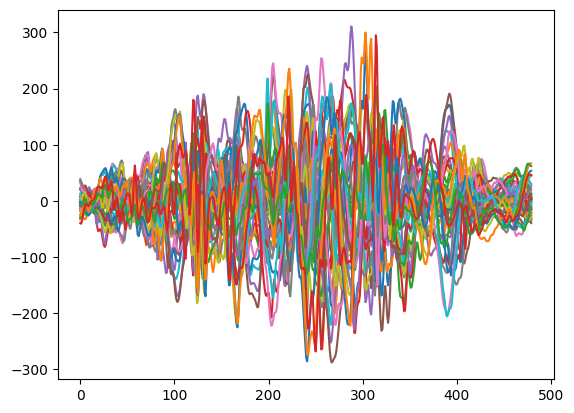

In [63]:
import matplotlib.pyplot as plt
plt.plot(y[2, :, :]);

In [66]:
data['key_label'][100]

np.float64(1.0)

In [67]:
data['emg_windows'].shape

(2796, 480, 64)

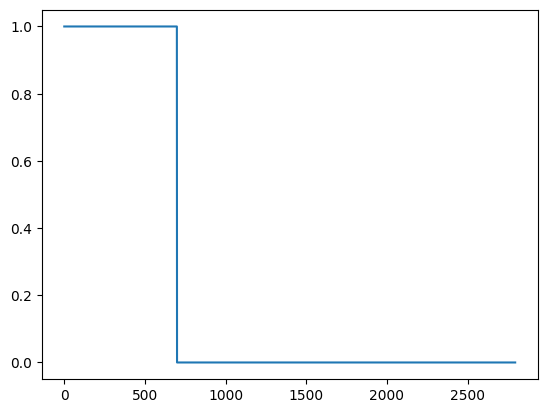

In [69]:
plt.plot(data['key_label'])

In [52]:
full

In [41]:
include_full_windows = True
dtype = [('full_windows', dataset.full_windows.dtype, dataset.full_windows.shape[1:]),
         ('emg_windows', dataset.X.dtype, dataset.X.shape[1:]),
         ('start_idxs', dataset.start_idxs.dtype, dataset.start_idxs.shape[1:]),
         ('key_label', dataset.y.dtype)]

data = np.zeros(dataset.X.shape[0], dtype=dtype)

data['start_idxs'] = dataset.start_idxs
data['full_windows'] = dataset.full_windows

data['emg_windows'] = dataset.X
data['key_label'] = dataset.y


In [32]:
dtype

[('full_windows', dtype('float64'), (1600, 64)),
 ('emg_windows', dtype('float64'), (480, 64)),
 ('start_idxs', dtype('int64'), ()),
 ('key_label', dtype('float64'))]

In [49]:
data['full_windows'].shape

(2796, 1600, 64)

In [20]:
print(key_data['keybuffer'].shape); print(emg_data['emgbuffer'].shape)

(700, 2)
(2287325, 67)


In [33]:
new_key_data

array([([                  0, 1727385568420319942,                  97],   14683,   0, 1727385568423831865),
       ([                  0, 1727385569217687101,                  97],   17882,   1, 1727385569218900553),
       ([                  0, 1727385570015092953,                 101],   21082,   2, 1727385570019081272),
       ([                  0, 1727385570812017017,                 104],   24281,   3, 1727385570814147296),
       ([                  0, 1727385571620063351,                 100],   27481,   4, 1727385571623853093),
       ([                  0, 1727385572428477191,                  97],   30748,   5, 1727385572428930503),
       ([                  0, 1727385573240923328,                 103],   34015,   6, 1727385573244200126),
       ([                  0, 1727385574055728232,                 104],   37281,   7, 1727385574058988840),
       ([                  0, 1727385574865426129,                  98],   40481,   8, 1727385574868824788),
       ([          

In [31]:
key_data

array([([1727385568420319942,                  97],   14683,   0, 1727385568423831865),
       ([1727385569217687101,                  97],   17882,   1, 1727385569218900553),
       ([1727385570015092953,                 101],   21082,   2, 1727385570019081272),
       ([1727385570812017017,                 104],   24281,   3, 1727385570814147296),
       ([1727385571620063351,                 100],   27481,   4, 1727385571623853093),
       ([1727385572428477191,                  97],   30748,   5, 1727385572428930503),
       ([1727385573240923328,                 103],   34015,   6, 1727385573244200126),
       ([1727385574055728232,                 104],   37281,   7, 1727385574058988840),
       ([1727385574865426129,                  98],   40481,   8, 1727385574868824788),
       ([1727385575670318230,                 102],   43680,   9, 1727385575673909050),
       ([1727385576479309742,                 101],   46947,  10, 1727385576484103688),
       ([1727385577275728706,   

### KeyDataset Exploration code 

In [ ]:
### E

In [441]:
filename = key_fname # first let's explore the key_stream.bin file
encoding: str = 'utf-8'
return_dict: bool = False

with open(filename, 'rb') as openfile:
    name = openfile.readline().decode(encoding).strip() # a string identifier for the data
    labels = openfile.readline().decode(encoding).strip() # a comma separated string of labels for the data columns
    dtypes = openfile.readline().decode(encoding).strip() # a comma-separated string of data types for the columns. It may also contain shapes.capitalize
    shapes = None
    # shapes can be indicated with a $ to separate
    if len(dtypes.split('$')) == 2:
        dtypes, shapes = dtypes.split('$')
        dtypes = dtypes.strip()
        shapes = ast.literal_eval(shapes.strip())

    labels = labels.split(',')
    dtypes = dtypes.split(',')
    if shapes is None:
        data = np.fromfile(openfile, dtype=list(zip(labels, dtypes)))
    else:
        data = np.fromfile(openfile, dtype=list(zip(labels, dtypes, shapes)))
    # if not return_dict:
    #     return data
    data_dict = {label: data[label] for label in labels}
    data_dict['name'] = name
    data_dict['labels'] = labels
    data_dict['dtypes'] = dtypes
    print(name); print(labels); print(dtypes); print(shapes); print(data['keybuffer'].shape)

key_stream
['keybuffer', 'emg_stream_step', 'key_stream_step', 'time_ns']
['2<i8', 'int64', 'int64', 'int64']
None
(700, 2)


In [442]:
data

array([([1727385568420319942,                  97],   14683,   0, 1727385568423831865),
       ([1727385569217687101,                  97],   17882,   1, 1727385569218900553),
       ([1727385570015092953,                 101],   21082,   2, 1727385570019081272),
       ([1727385570812017017,                 104],   24281,   3, 1727385570814147296),
       ([1727385571620063351,                 100],   27481,   4, 1727385571623853093),
       ([1727385572428477191,                  97],   30748,   5, 1727385572428930503),
       ([1727385573240923328,                 103],   34015,   6, 1727385573244200126),
       ([1727385574055728232,                 104],   37281,   7, 1727385574058988840),
       ([1727385574865426129,                  98],   40481,   8, 1727385574868824788),
       ([1727385575670318230,                 102],   43680,   9, 1727385575673909050),
       ([1727385576479309742,                 101],   46947,  10, 1727385576484103688),
       ([1727385577275728706,   

In [443]:
filename = emg_fname # first let's explore the key_stream.bin file
encoding: str = 'utf-8'
return_dict: bool = False

with open(filename, 'rb') as openfile:
    name = openfile.readline().decode(encoding).strip() # a string identifier for the data
    labels = openfile.readline().decode(encoding).strip() # a comma separated string of labels for the data columns
    dtypes = openfile.readline().decode(encoding).strip() # a comma-separated string of data types for the columns. It may also contain shapes.capitalize
    shapes = None
    # shapes can be indicated with a $ to separate
    if len(dtypes.split('$')) == 2:
        dtypes, shapes = dtypes.split('$')
        dtypes = dtypes.strip()
        shapes = ast.literal_eval(shapes.strip())
    # shapes can be indicated with a $ to separate
    if len(dtypes.split('$')) == 2:
        dtypes, shapes = dtypes.split('$')
        dtypes = dtypes.strip()
        shapes = ast.literal_eval(shapes.strip())

    labels = labels.split(',')
    dtypes = dtypes.split(',')
    if shapes is None:
        data = np.fromfile(openfile, dtype=list(zip(labels, dtypes)))
    else:
        data = np.fromfile(openfile, dtype=list(zip(labels, dtypes, shapes)))

    print(name); print(labels); print(dtypes); print(shapes); print(data['emgbuffer'].shape); print(data.shape)


emg_stream
['emgbuffer', 'emg_stream_step', 'key_stream_step', 'time_ns']
['67<f8', 'int64', 'int64', 'int64']
None
(2287325, 67)
(2287325,)


In [444]:
def load_data(filename: str, return_dict: bool = False, encoding: str = 'utf-8') -> np.ndarray or dict:
    """
    Legacy binary file data loading function from Raspy. Rumi integrates shapes and dtypes into the same line while
    maintaining compatibility.
    :param filename: Filename of the binary file to load.
    :param return_dict: Whether to return a dictionary or a structured Numpy array.
    :param encoding: Encoding to decode the header of the binary file.
    :return: Dictionary or numpy array of the data.
    """
    with open(filename, 'rb') as openfile:
        name = openfile.readline().decode(encoding).strip()
        labels = openfile.readline().decode(encoding).strip()
        dtypes = openfile.readline().decode(encoding).strip()
        shapes = None
        # shapes can be indicated with a $ to separate.
        if len(dtypes.split('$')) == 2:
            dtypes, shapes = dtypes.split('$')
            dtypes = dtypes.strip()
            shapes = ast.literal_eval(shapes.strip())

        labels = labels.split(',')
        dtypes = dtypes.split(',')
        if shapes is None:
            data = np.fromfile(openfile, dtype=list(zip(labels, dtypes)))
        else:
            data = np.fromfile(openfile, dtype=list(zip(labels, dtypes, shapes)))
        if not return_dict:
            return data
        data_dict = {label: data[label] for label in labels}
        data_dict['name'] = name
        data_dict['labels'] = labels
        data_dict['dtypes'] = dtypes
    return data_dict

In [445]:
key_fname, emg_fname

('./data/derek_d1_abhishek_offline_2024-09-26-1419_Rhythm-Game-Typing-Task/data_streams/key_stream.bin',
 './data/derek_d1_abhishek_offline_2024-09-26-1419_Rhythm-Game-Typing-Task/data_streams/emg_stream.bin')

In [446]:
key_data = load_data(key_fname)
emg_data = load_data(emg_fname)

In [447]:
key_data.dtype, emg_data.dtype

(dtype([('keybuffer', '<i8', (2,)), ('emg_stream_step', '<i8'), ('key_stream_step', '<i8'), ('time_ns', '<i8')]),
 dtype([('emgbuffer', '<f8', (67,)), ('emg_stream_step', '<i8'), ('key_stream_step', '<i8'), ('time_ns', '<i8')]))

In [448]:
emg_names = ['emgbuffer'] + list(emg_data.dtype.names)[1:]
key_names = ['keybuffer'] + list(key_data.dtype.names)[1:]

emg_names, key_names

(['emgbuffer', 'emg_stream_step', 'key_stream_step', 'time_ns'],
 ['keybuffer', 'emg_stream_step', 'key_stream_step', 'time_ns'])

In [449]:
print([chr(i) for i in key_data['keybuffer'][:80, 1]])

['a', 'a', 'e', 'h', 'd', 'a', 'g', 'h', 'b', 'f', 'e', 'b', 'g', 'b', 'g', 'g', 'b', 'b', 'g', 'f', 'e', 'f', 'g', 'h', 'a', 'g', 'a', 'a', 'a', 'h', 'b', 'f', 'a', 'b', 'a', 'h', 'd', 'g', 'f', 'h', 'h', 'g', 'b', 'd', 'f', 'h', 'd', 'b', 'e', 'h', 'h', 'f', 'h', 'g', 'b', 'b', 'e', 'a', 'd', 'd', 'd', 'e', 'f', 'f', 'g', 'g', 'f', 'd', 'h', 'b', 'b', 'g', 'f', 'a', 'g', 'b', 'g', 'f', 'd', 'f']


In [450]:
print(emg_data.shape)

(2287325,)


In [451]:
key_data.dtype

dtype([('keybuffer', '<i8', (2,)), ('emg_stream_step', '<i8'), ('key_stream_step', '<i8'), ('time_ns', '<i8')])

In [452]:
key_data.size

700

In [453]:
new_key_data = np.zeros(key_data.size,
                        dtype=[('keybuffer', '<i8', (3,)), ('emg_stream_step','<i8'), ('key_stream_step', '<i8'), ('time_ns','<i8')])
new_key_data

array([([0, 0, 0], 0, 0, 0), ([0, 0, 0], 0, 0, 0), ([0, 0, 0], 0, 0, 0),
       ([0, 0, 0], 0, 0, 0), ([0, 0, 0], 0, 0, 0), ([0, 0, 0], 0, 0, 0),
       ([0, 0, 0], 0, 0, 0), ([0, 0, 0], 0, 0, 0), ([0, 0, 0], 0, 0, 0),
       ([0, 0, 0], 0, 0, 0), ([0, 0, 0], 0, 0, 0), ([0, 0, 0], 0, 0, 0),
       ([0, 0, 0], 0, 0, 0), ([0, 0, 0], 0, 0, 0), ([0, 0, 0], 0, 0, 0),
       ([0, 0, 0], 0, 0, 0), ([0, 0, 0], 0, 0, 0), ([0, 0, 0], 0, 0, 0),
       ([0, 0, 0], 0, 0, 0), ([0, 0, 0], 0, 0, 0), ([0, 0, 0], 0, 0, 0),
       ([0, 0, 0], 0, 0, 0), ([0, 0, 0], 0, 0, 0), ([0, 0, 0], 0, 0, 0),
       ([0, 0, 0], 0, 0, 0), ([0, 0, 0], 0, 0, 0), ([0, 0, 0], 0, 0, 0),
       ([0, 0, 0], 0, 0, 0), ([0, 0, 0], 0, 0, 0), ([0, 0, 0], 0, 0, 0),
       ([0, 0, 0], 0, 0, 0), ([0, 0, 0], 0, 0, 0), ([0, 0, 0], 0, 0, 0),
       ([0, 0, 0], 0, 0, 0), ([0, 0, 0], 0, 0, 0), ([0, 0, 0], 0, 0, 0),
       ([0, 0, 0], 0, 0, 0), ([0, 0, 0], 0, 0, 0), ([0, 0, 0], 0, 0, 0),
       ([0, 0, 0], 0, 0, 0), ([0, 0, 0], 0, 0, 0), 

In [454]:
new_key_data['keybuffer'] = np.concatenate((np.zeros_like(key_data['keybuffer'][:, 1:2]),
                key_data['keybuffer']), axis=1)
new_key_data['emg_stream_step'] = key_data['emg_stream_step']
new_key_data['key_stream_step'] = key_data['key_stream_step']
new_key_data['time_ns'] = key_data['time_ns']


In [455]:
layout = [['q', 'w', 'e', 'r', 't', 'y', 'u', 'i', 'o', 'p'],
          ['a', 's', 'd', 'f', 'g', 'h', 'j', 'k', 'l'],
          ['z', 'x', 'c', 'v', 'b', 'n', 'm'],
          [' '],
          [chr(0)]]

In [456]:
emg_stream = emg_data['emgbuffer']

In [457]:
emg_data.dtype

dtype([('emgbuffer', '<f8', (67,)), ('emg_stream_step', '<i8'), ('key_stream_step', '<i8'), ('time_ns', '<i8')])

### KeyDataset

In [458]:
# dataset = KeyDataset(emg_stream, new_key_data, layout, window_pre, window_post, subwindow_len,
#                         start_channel=1, 
#                         end_channel=65, bipolar=False, avg_ref=True, binary=True, 
#                         include_blanks=True, 
#                         limit_blanks=False,
#                         filter_params=filter_params)

In [459]:
binary = True; augment = False; subwindow_len = 480; init=True; filter_params = None; start_channel = 1; end_channel=65
avg_ref = True; window_pre = 800; window_post = 800; include_blanks = True; limit_blanks = False
if not init:
    X = None
    y = None
    start_idxs = None
    num_chans = None
    full_windows = None

if filter_params is None:
    filter_params = {}
fn = filter_params.get('fn', [60, 120, 180, 60, 300, 240])
qs = filter_params.get('qs', [10, 5, 2, 4, 2, 2])
fc = filter_params.get('fc', (10, 1000))
fs = filter_params.get('fs', 4000)

filt = Filter(fn, qs, fc=fc, butterworth_type='bandpass', order=4, sampling_freq=fs)
if start_channel is None:
    start_channel = 0
if end_channel is None:
    end_channel = emg_stream.shape[-1]

emg_buffer = emg_stream[..., start_channel:end_channel]


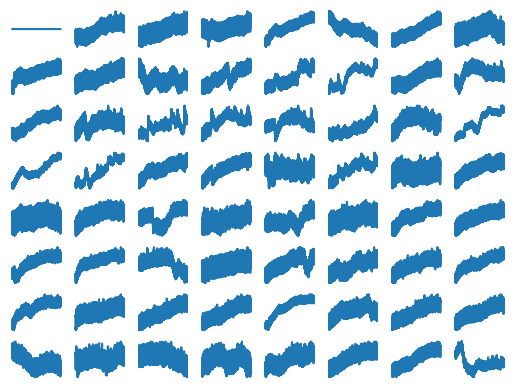

In [460]:
%matplotlib inline
import matplotlib.pyplot as plt

# plot emg_stream. each row is a channel. flexibly select which channels to plot
import matplotlib.pyplot as plt
# plt.plot(emg_stream[:, 50]);
# plot each channel as a subplot
for i in range(emg_buffer.shape[1]):
    plt.subplot(8, 8, i+1)
    plt.plot(emg_stream[:, i])
    plt.axis('off')
plt.show()

In [461]:
def average_reference(data: np.ndarray) -> np.ndarray:
    _, num_chans = data.shape
    if num_chans % 32 != 0:
        raise ValueError("Number of channels should be a multiple of 32 for HD-EMG grids!")
    num_grids = num_chans // 32

    for i in range(num_grids):
        data[:, i * 32:(i + 1) * 32] = (data[:, i * 32:(i + 1) * 32].T - np.mean(data[:, i * 32:(i + 1) * 32], axis=1)).T
    
    return data

In [462]:
if avg_ref:
    emg_buffer = average_reference(emg_buffer)

filtered_emg_stream = filt.filter_data(emg_buffer)

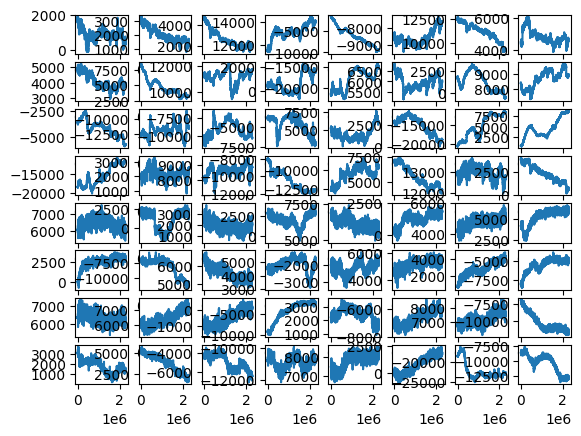

In [463]:
for i in range(emg_buffer.shape[1]):
    plt.subplot(8, 8, i+1)
    plt.plot(emg_buffer[:, i])
    # plt.axis('off')
plt.show()

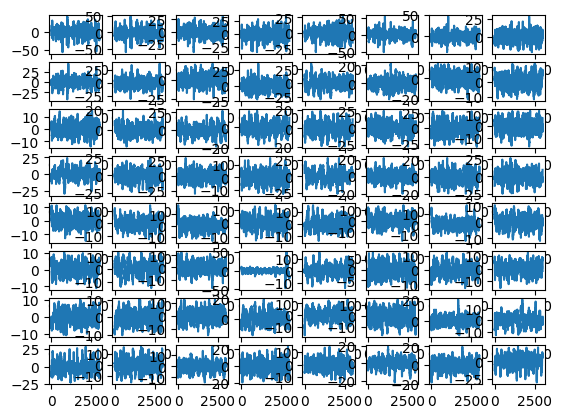

In [464]:
for i in range(filtered_emg_stream.shape[1]):
    plt.subplot(8, 8, i+1)
    plt.plot(filtered_emg_stream[5000:8000, i])
    # plt.axis('off')
plt.show()

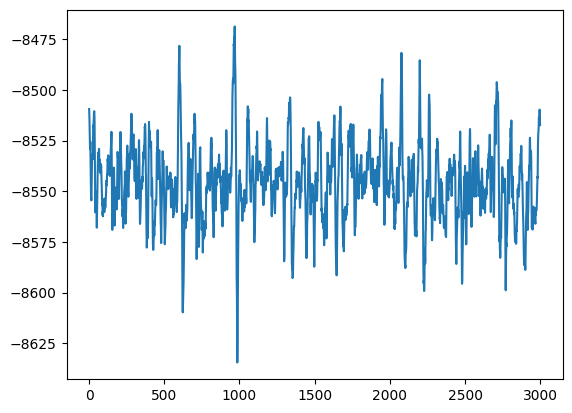

In [465]:
plt.plot(emg_buffer[5000:8000,5]);

# plt.axis('off');

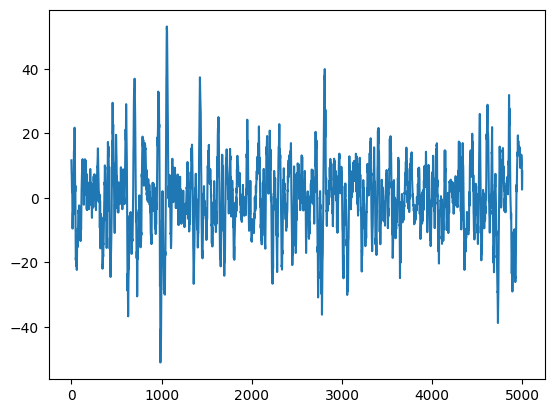

In [466]:
plt.plot(filtered_emg_stream[5000:10000,5])

In [467]:
num_chans = filtered_emg_stream.shape[-1]


In [468]:
key_start_data = new_key_data[new_key_data['keybuffer'][:,0] == 0]
nonoverlapping_key_data = key_start_data

In [469]:
nonoverlapping_key_data

array([([                  0, 1727385568420319942,                  97],   14683,   0, 1727385568423831865),
       ([                  0, 1727385569217687101,                  97],   17882,   1, 1727385569218900553),
       ([                  0, 1727385570015092953,                 101],   21082,   2, 1727385570019081272),
       ([                  0, 1727385570812017017,                 104],   24281,   3, 1727385570814147296),
       ([                  0, 1727385571620063351,                 100],   27481,   4, 1727385571623853093),
       ([                  0, 1727385572428477191,                  97],   30748,   5, 1727385572428930503),
       ([                  0, 1727385573240923328,                 103],   34015,   6, 1727385573244200126),
       ([                  0, 1727385574055728232,                 104],   37281,   7, 1727385574058988840),
       ([                  0, 1727385574865426129,                  98],   40481,   8, 1727385574868824788),
       ([          

In [470]:
new_key_data

array([([                  0, 1727385568420319942,                  97],   14683,   0, 1727385568423831865),
       ([                  0, 1727385569217687101,                  97],   17882,   1, 1727385569218900553),
       ([                  0, 1727385570015092953,                 101],   21082,   2, 1727385570019081272),
       ([                  0, 1727385570812017017,                 104],   24281,   3, 1727385570814147296),
       ([                  0, 1727385571620063351,                 100],   27481,   4, 1727385571623853093),
       ([                  0, 1727385572428477191,                  97],   30748,   5, 1727385572428930503),
       ([                  0, 1727385573240923328,                 103],   34015,   6, 1727385573244200126),
       ([                  0, 1727385574055728232,                 104],   37281,   7, 1727385574058988840),
       ([                  0, 1727385574865426129,                  98],   40481,   8, 1727385574868824788),
       ([          

In [471]:
layout

[['q', 'w', 'e', 'r', 't', 'y', 'u', 'i', 'o', 'p'],
 ['a', 's', 'd', 'f', 'g', 'h', 'j', 'k', 'l'],
 ['z', 'x', 'c', 'v', 'b', 'n', 'm'],
 [' '],
 ['\x00']]

In [472]:
layout = [['q', 'w', 'e', 'r', 't', 'y', 'u', 'i', 'o', 'p'],
          ['a', 's', 'd', 'f', 'g', 'h', 'j', 'k', 'l'],
          ['z', 'x', 'c', 'v', 'b', 'n', 'm'],
          [' '],
          [chr(0)]]

In [473]:
def select_keys(key_data: np.ndarray, layout: list) -> np.ndarray:
    """
    Select only the keypresses in a given layout from the key data.
    :param key_data: Structured Numpy array containing keypress data.
    :param layout: Nested list containing the chars in the layout of the keyboard.
    :return: Key data with all keypresses not in the layout removed.
    """
    if isinstance(layout[0], list):
        layout = [item for sublist in layout for item in sublist]

    key_conditions = []
    for key in layout:
        if type(key) == str:
            key_code = ord(key)
        elif type(key) == int:
            key_code = key
        else:
            raise ValueError
        key_conditions.append(key_data['keybuffer'][:, 2] == key_code)

    clean_bools = key_conditions[0]
    for i in range(1, len(key_conditions)):
        clean_bools = np.logical_or(clean_bools, key_conditions[i])

    return key_data[clean_bools]

In [474]:
selected_key_data = select_keys(nonoverlapping_key_data, layout)

In [475]:
selected_key_data = selected_key_data[1:]

In [476]:
key_labels = selected_key_data['keybuffer'][...,2]
key_labels

array([ 97, 101, 104, 100,  97, 103, 104,  98, 102, 101,  98, 103,  98,
       103, 103,  98,  98, 103, 102, 101, 102, 103, 104,  97, 103,  97,
        97,  97, 104,  98, 102,  97,  98,  97, 104, 100, 103, 102, 104,
       104, 103,  98, 100, 102, 104, 100,  98, 101, 104, 104, 102, 104,
       103,  98,  98, 101,  97, 100, 100, 100, 101, 102, 102, 103, 103,
       102, 100, 104,  98,  98, 103, 102,  97, 103,  98, 103, 102, 100,
       102, 104, 100, 101, 100, 101, 101, 103,  97,  98, 102, 102,  97,
       101, 102, 104, 100, 103,  98,  97,  98, 100,  97, 100, 101, 100,
       101, 104, 100,  98, 101, 100, 102,  97,  98, 103,  97,  98,  97,
        97, 100, 103,  97, 100, 102,  98, 104,  97, 101, 100,  97,  98,
       100, 104, 104,  98, 103, 103, 100, 102, 100, 102, 103, 103, 101,
        97, 103,  98, 104,  97, 104, 101, 101, 101, 103, 102, 100, 103,
       100,  97, 102, 104, 101, 101, 101, 103, 102, 102,  97,  97, 104,
       104,  98, 101, 102,  97, 100,  97, 103, 104, 100,  98, 10

In [477]:
key_labels.shape

(699,)

In [478]:
np.unique(key_labels, return_counts=True)

(array([ 97,  98, 100, 101, 102, 103, 104]),
 array([ 99, 100, 100, 100, 100, 100, 100]))

In [479]:
key_labels!=0

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,

In [480]:
selected_key_data

array([([                  0, 1727385569217687101,                  97],   17882,   1, 1727385569218900553),
       ([                  0, 1727385570015092953,                 101],   21082,   2, 1727385570019081272),
       ([                  0, 1727385570812017017,                 104],   24281,   3, 1727385570814147296),
       ([                  0, 1727385571620063351,                 100],   27481,   4, 1727385571623853093),
       ([                  0, 1727385572428477191,                  97],   30748,   5, 1727385572428930503),
       ([                  0, 1727385573240923328,                 103],   34015,   6, 1727385573244200126),
       ([                  0, 1727385574055728232,                 104],   37281,   7, 1727385574058988840),
       ([                  0, 1727385574865426129,                  98],   40481,   8, 1727385574868824788),
       ([                  0, 1727385575670318230,                 102],   43680,   9, 1727385575673909050),
       ([          

In [481]:
filtered_emg_stream.shape

(2287325, 64)

In [482]:
selected_key_data['emg_stream_step'].shape, window_pre, window_post

((699,), 800, 800)

### create windows

In [483]:
num_chans = filtered_emg_stream.shape[-1]
emg_stream_step_idxs = selected_key_data['emg_stream_step']
key_windows = np.zeros((emg_stream_step_idxs.size, window_pre + window_post, num_chans), dtype = np.float64)
num_chans, emg_stream_step_idxs.shape, key_windows.shape


(64, (699,), (699, 1600, 64))

In [484]:
for i, step in enumerate(emg_stream_step_idxs):
    if(step + window_post > len(filtered_emg_stream)):
        continue
    key_windows[i] = filtered_emg_stream[int(step - window_pre):int(step + window_post), :]

In [485]:
len(filtered_emg_stream)

2287325

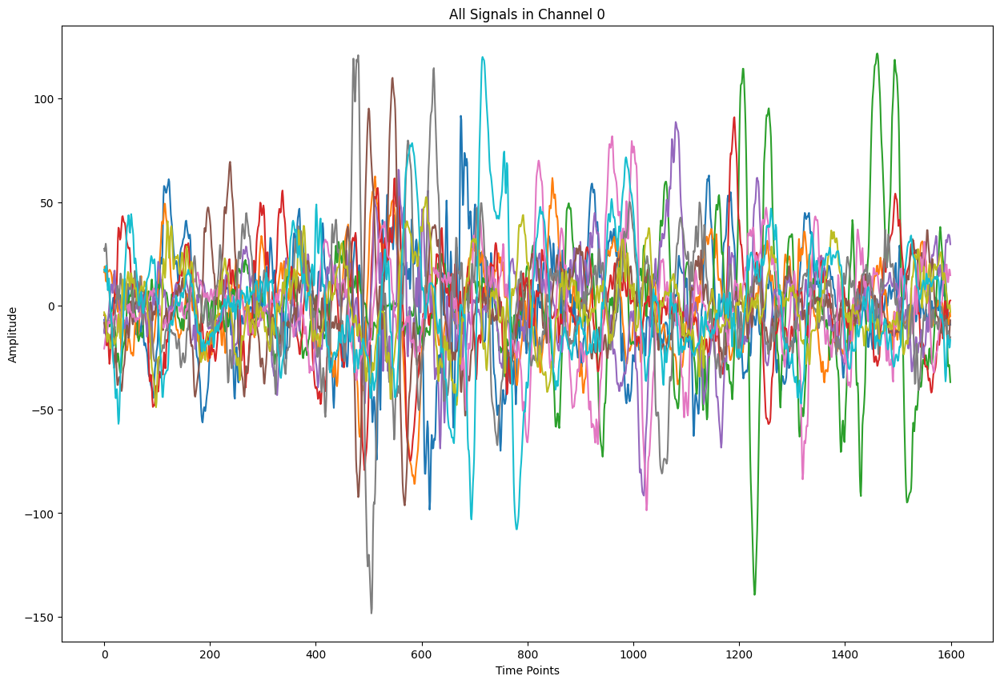

In [486]:
import matplotlib.pyplot as plt

# Assuming key_windows is already defined and contains the data
num_windows = key_windows.shape[0]
time_points = key_windows.shape[1]
channel = 0  # Channel to plot

plt.figure(figsize=(15, 10))

# Plot each window for channel 0
for i in range(10):#range(num_windows):
    plt.plot(key_windows[i, :, channel], label=f'Window {i}' if i < 10 else "")  # Label only the first 10 for clarity

plt.title('All Signals in Channel 0')
plt.xlabel('Time Points')
plt.ylabel('Amplitude')
# plt.legend(loc='upper right', bbox_to_anchor=(1.15, 1.05), ncol=2, fontsize='small')
plt.show()

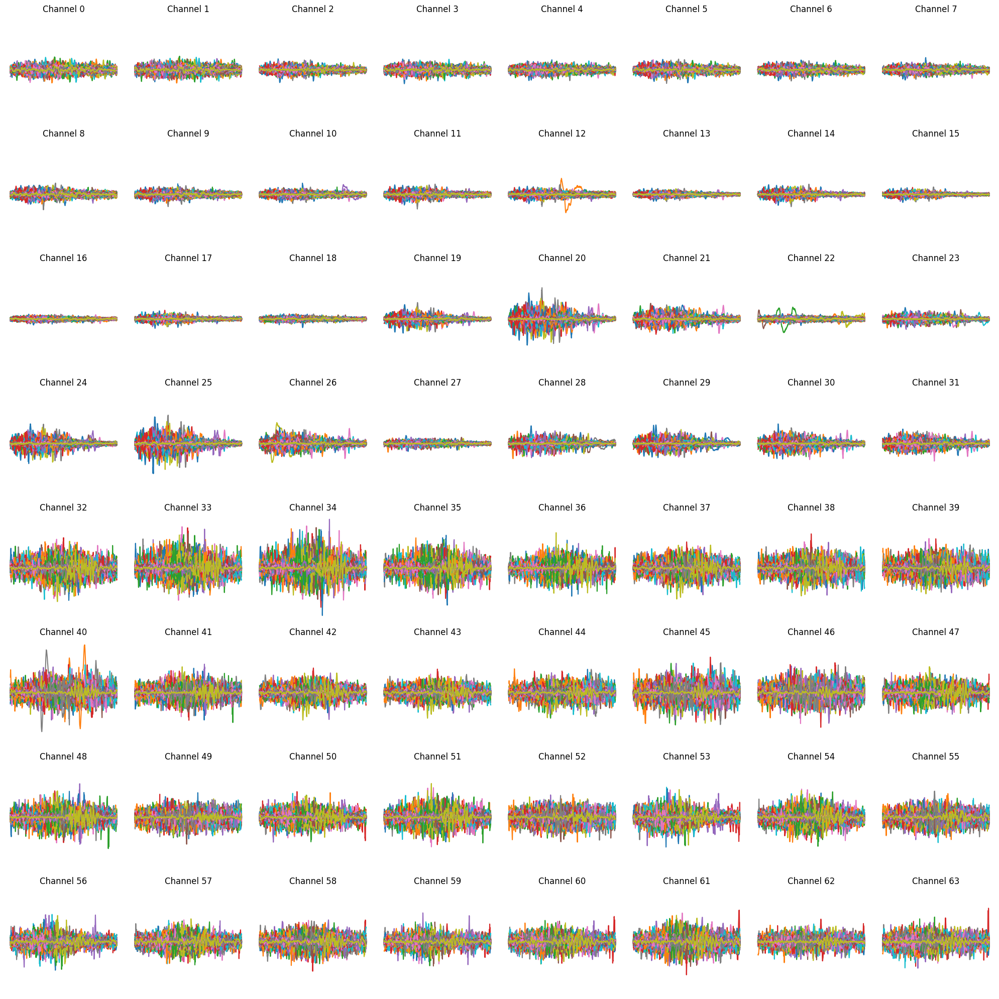

In [487]:
# import matplotlib.pyplot as plt

# # Assuming key_windows is already defined and contains the data
# num_windows = key_windows.shape[0]
# time_points = key_windows.shape[1]
# num_channels = key_windows.shape[2]

# # Create a figure with 8 by 8 subplots
# fig, axes = plt.subplots(8, 8, figsize=(20, 20), sharex=True, sharey=True)

# # Plot each channel
# for channel in range(num_channels):
#     row = channel // 8
#     col = channel % 8
#     ax = axes[row, col]
    
#     # Plot each window for the current channel
#     for i in range(num_windows):
#         ax.plot(key_windows[i, :, channel])
    
#     ax.set_title(f'Channel {channel}')
#     ax.axis('off')  # Turn off the axis if desired

# # Adjust layout to prevent overlap
# plt.tight_layout()
# plt.show()

671


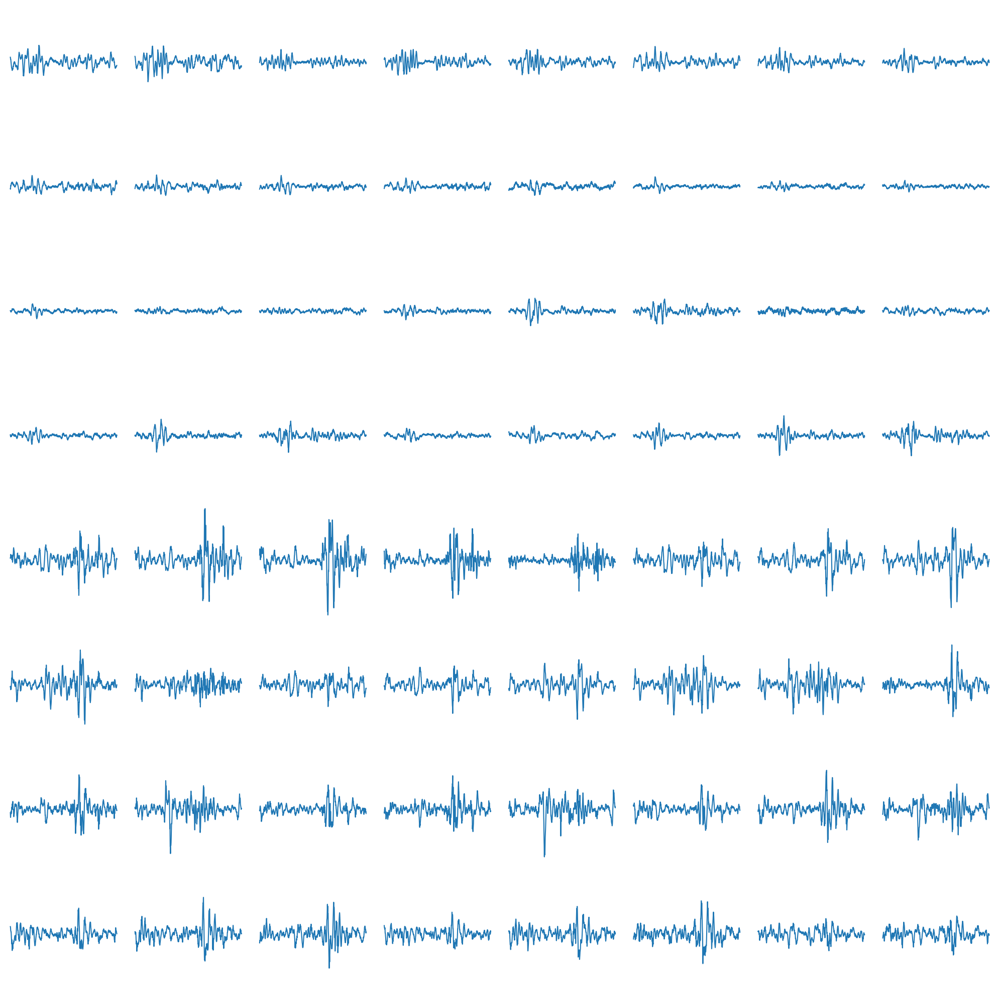

In [488]:
import matplotlib.pyplot as plt

# Assuming key_windows is already defined and contains the data
num_windows = key_windows.shape[0]
time_points = key_windows.shape[1]
num_channels = key_windows.shape[2]

# Specify the window index to plot
window_index = np.random.randint(0, num_windows)  # Change this index to plot a different window
print(window_index)

# Create a figure with 8 by 8 subplots
fig, axes = plt.subplots(8, 8, figsize=(20, 20), sharex=True, sharey=True)

# Plot each channel for the specified window
for channel in range(num_channels):
    row = channel // 8
    col = channel % 8
    ax = axes[row, col]
    
    # Plot the signal for the current channel in the specified window
    ax.plot(key_windows[window_index, :, channel])
    
    # ax.set_title(f'Channel {channel}')
    ax.axis('off')  # Turn off the axis if desired

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()

In [489]:
def create_windows(emg_stream: np.ndarray, emg_stream_step_idxs: np.ndarray, window_pre: int, window_post: int,
                   dtype=np.float64) -> np.ndarray:
    """
    Create windows of EMG data around the listed indices.
    :param emg_stream: EMG data stream of shape (num_samples, num_channels).
    :param emg_stream_step_idxs: List of emg_stream indices to create windows around.
    :param window_pre: Number of samples to include before the keypress.
    :param window_post: Number of samples to include after the keypress.
    :param dtype: Data type of the returned array.
    :return: Array of shape (num_windows, window_pre + window_post, num_channels) containing the EMG windows.
    """
    num_chans = emg_stream.shape[-1]
    key_windows = np.zeros((emg_stream_step_idxs.size, window_pre + window_post, num_chans), dtype=dtype)

    for i, step in enumerate(emg_stream_step_idxs):
        if(step + window_post > len(emg_stream)):
            continue
        key_windows[i] = emg_stream[int(step - window_pre):int(step + window_post), :]
    return key_windows

In [490]:
key_windows = create_windows(filtered_emg_stream, selected_key_data['emg_stream_step'], window_pre,
                                window_post)
print(key_windows.shape)

(699, 1600, 64)


In [491]:
include_blanks = True
if binary:
    if not include_blanks:
        raise ValueError("Cannot use binary labels without including blanks!")
    y = key_labels != 0
else:
    y = key_labels

In [492]:
y.shape, np.sum(y)

((699,), np.int64(699))

#### Get blank idxs

In [493]:
exclude_long_stretches = True
new_key_data.shape, new_key_data.dtype, window_pre, window_post, subwindow_len, exclude_long_stretches

((700,),
 dtype([('keybuffer', '<i8', (3,)), ('emg_stream_step', '<i8'), ('key_stream_step', '<i8'), ('time_ns', '<i8')]),
 800,
 800,
 480,
 True)

In [494]:
emg_steps = new_key_data['emg_stream_step']
blank_idxs = []

est_duration = None
for step_idx, step in enumerate(emg_steps[:-1]):
    blank_idx = int(step + window_post + subwindow_len // 2)
    if est_duration:
        blank_idx += est_duration
    if exclude_long_stretches and emg_steps[step_idx + 1] - emg_steps[step_idx] > 8000:
        print('excluded blank period after ', blank_idx, 'th key because it\'s',(emg_steps[step_idx + 1] - emg_steps[step_idx])/4000, 's long')
        continue
    while blank_idx < emg_steps[step_idx + 1] - (window_pre + subwindow_len//2):
        blank_idxs.append(blank_idx)
        blank_idx += subwindow_len
    # print(step, blank_idxs)

print(len(blank_idxs))

2097


In [495]:
def get_blank_idxs(key_data: np.ndarray, window_pre: int, window_post: int, subwindow_len: int, est_duration: int = None, exclude_long_stretches = False) -> np.ndarray:
    """
    Get nonoverlapping indices for windows of EMG data where no events occur
    :param key_data: Original unprocessed key data, since we do not want removed keypresses in our blank windows (or
    releases).
    :param window_pre: Number of samples to include before the blank index.
    :param window_post: Number of samples to include after the blank index.
    :param est_duration: Estimated duration of event if no ground truth key release is available, i.e. in rhythm game
    :return: Array of indices of blank EMG data.
    """
    emg_steps = key_data['emg_stream_step']
    blank_idxs = []
    for step_idx, step in enumerate(emg_steps[:-1]):
        blank_idx = int(step + window_post + subwindow_len//2)
        if est_duration:
            blank_idx += est_duration
        if exclude_long_stretches and emg_steps[step_idx + 1] - emg_steps[step_idx] > 8000: 
            print('excluded blank period after ', blank_idx, 'th key because it\'s ',(emg_steps[step_idx + 1] - emg_steps[step_idx])/4000, 's long')
            continue
        while blank_idx < emg_steps[step_idx + 1] - (window_pre + subwindow_len//2):
            blank_idxs.append(blank_idx)
            blank_idx += subwindow_len
    return np.array(blank_idxs)

In [496]:
if include_blanks:
    blank_idxs = get_blank_idxs(new_key_data, window_pre, window_post, subwindow_len, exclude_long_stretches=True)

In [497]:
classes, counts = np.unique(key_labels, return_counts=True)

In [498]:
classes, counts

(array([ 97,  98, 100, 101, 102, 103, 104]),
 array([ 99, 100, 100, 100, 100, 100, 100]))

In [499]:
blank_idxs[:15]

array([15723, 16203, 16683, 18922, 19402, 19882, 22122, 22602, 23082,
       25321, 25801, 26281, 28521, 29001, 29481])

In [540]:
15483+240 + 480

16203

In [522]:
# blank windows
[(int(start), int(end)) for start, end in zip(blank_idxs[:15] - 800, blank_idxs[:15] + 800)]

[(14923, 16523),
 (15403, 17003),
 (15883, 17483),
 (18122, 19722),
 (18602, 20202),
 (19082, 20682),
 (21322, 22922),
 (21802, 23402),
 (22282, 23882),
 (24521, 26121),
 (25001, 26601),
 (25481, 27081),
 (27721, 29321),
 (28201, 29801),
 (28681, 30281)]

In [523]:
# emg windows
[(int(start), int(end)) for start, end in zip(emg_steps[:10] - 800, emg_steps[:10] + 800)]

[(13883, 15483),
 (17082, 18682),
 (20282, 21882),
 (23481, 25081),
 (26681, 28281),
 (29948, 31548),
 (33215, 34815),
 (36481, 38081),
 (39681, 41281),
 (42880, 44480)]

In [538]:
# blank windows adjusted
[(int(start + 560), int(start + 560 + 480)) for start, end in zip(blank_idxs[:15] - 800, blank_idxs[:15] + 800)]

[(15483, 15963),
 (15963, 16443),
 (16443, 16923),
 (18682, 19162),
 (19162, 19642),
 (19642, 20122),
 (21882, 22362),
 (22362, 22842),
 (22842, 23322),
 (25081, 25561),
 (25561, 26041),
 (26041, 26521),
 (28281, 28761),
 (28761, 29241),
 (29241, 29721)]

In [549]:
(240/4000)*1000, (800/4000)*1000

(60.0, 200.0)

In [547]:
16683 + 240

16923

In [546]:
17882 - 800 - 240

16842

In [543]:
17642-16923

719

In [537]:
# emg windows adjusted
[(int(start + 560), int(start + 560 + 480)) for start, end in zip(emg_steps[:10] - 800, emg_steps[:10] + 800)]

[(14443, 14923),
 (17642, 18122),
 (20842, 21322),
 (24041, 24521),
 (27241, 27721),
 (30508, 30988),
 (33775, 34255),
 (37041, 37521),
 (40241, 40721),
 (43440, 43920)]

In [541]:
emg_steps[:10] - 240, emg_steps[:10] + 240

(array([14443, 17642, 20842, 24041, 27241, 30508, 33775, 37041, 40241,
        43440]),
 array([14923, 18122, 21322, 24521, 27721, 30988, 34255, 37521, 40721,
        43920]))

In [529]:
15483 - 14923, 17483 - 17082, 18682 - 18122

(560, 401, 560)

In [501]:
emg_steps[:10] - 800, emg_steps[:10] + 800

(array([13883, 17082, 20282, 23481, 26681, 29948, 33215, 36481, 39681,
        42880]),
 array([15483, 18682, 21882, 25081, 28281, 31548, 34815, 38081, 41281,
        44480]))

In [502]:
15483-14923

560

In [534]:
(1600 - 480)//2

560

In [535]:
560+480

1040

In [536]:
560/240

2.3333333333333335

In [503]:
emg_steps

array([  14683,   17882,   21082,   24281,   27481,   30748,   34015,
         37281,   40481,   43680,   46947,   50147,   53366,   56613,
         59880,   63080,   66347,   69546,   72813,   76013,   79212,
         82470,   85679,   88926,   92069,   95344,   98544,  101809,
        105044,  108269,  111510,  114717,  117977,  121176,  124443,
        127643,  130842,  134109,  137309,  140576,  143775,  147042,
        150309,  153509,  156775,  159975,  163174,  166374,  169574,
        172840,  176040,  179307,  182506,  185773,  188973,  192220,
        195494,  198639,  201879,  205081,  208305,  211538,  214769,
        218022,  221225,  224478,  227673,  230937,  234204,  237404,
        240670,  243870,  247069,  250336,  253469,  256735,  260002,
        263269,  266536,  269736,  273002,  276269,  279402,  282668,
        285935,  289135,  292402,  295601,  298801,  301985,  305200,
        308433,  311714,  314854,  318120,  321328,  324579,  327832,
        331035,  334

In [504]:
emg_steps[:]

array([  14683,   17882,   21082,   24281,   27481,   30748,   34015,
         37281,   40481,   43680,   46947,   50147,   53366,   56613,
         59880,   63080,   66347,   69546,   72813,   76013,   79212,
         82470,   85679,   88926,   92069,   95344,   98544,  101809,
        105044,  108269,  111510,  114717,  117977,  121176,  124443,
        127643,  130842,  134109,  137309,  140576,  143775,  147042,
        150309,  153509,  156775,  159975,  163174,  166374,  169574,
        172840,  176040,  179307,  182506,  185773,  188973,  192220,
        195494,  198639,  201879,  205081,  208305,  211538,  214769,
        218022,  221225,  224478,  227673,  230937,  234204,  237404,
        240670,  243870,  247069,  250336,  253469,  256735,  260002,
        263269,  266536,  269736,  273002,  276269,  279402,  282668,
        285935,  289135,  292402,  295601,  298801,  301985,  305200,
        308433,  311714,  314854,  318120,  321328,  324579,  327832,
        331035,  334

In [505]:
blank_windows = create_windows(filtered_emg_stream, blank_idxs, window_pre, window_post)
blank_windows.shape

(2097, 1600, 64)

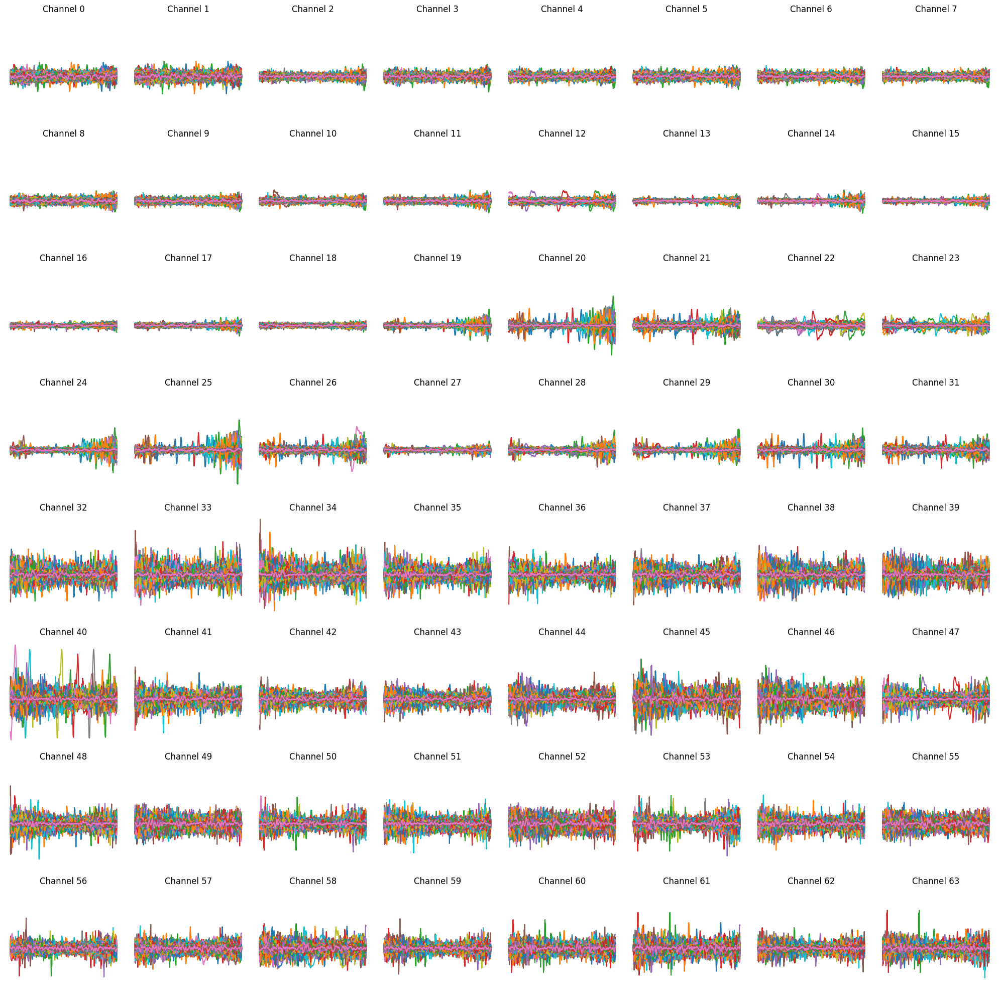

In [506]:
# import matplotlib.pyplot as plt

# # Assuming key_windows is already defined and contains the data
# num_windows = blank_windows.shape[0]
# time_points = blank_windows.shape[1]
# num_channels = blank_windows.shape[2]

# # Create a figure with 8 by 8 subplots
# fig, axes = plt.subplots(8, 8, figsize=(20, 20), sharex=True, sharey=True)

# # Plot each channel
# for channel in range(num_channels):
#     row = channel // 8
#     col = channel % 8
#     ax = axes[row, col]
    
#     # Plot each window for the current channel
#     for i in range(num_windows):
#         ax.plot(blank_windows[i, :, channel])
    
#     ax.set_title(f'Channel {channel}')
#     ax.axis('off')  # Turn off the axis if desired

# # Adjust layout to prevent overlap
# plt.tight_layout()
# plt.show()

700


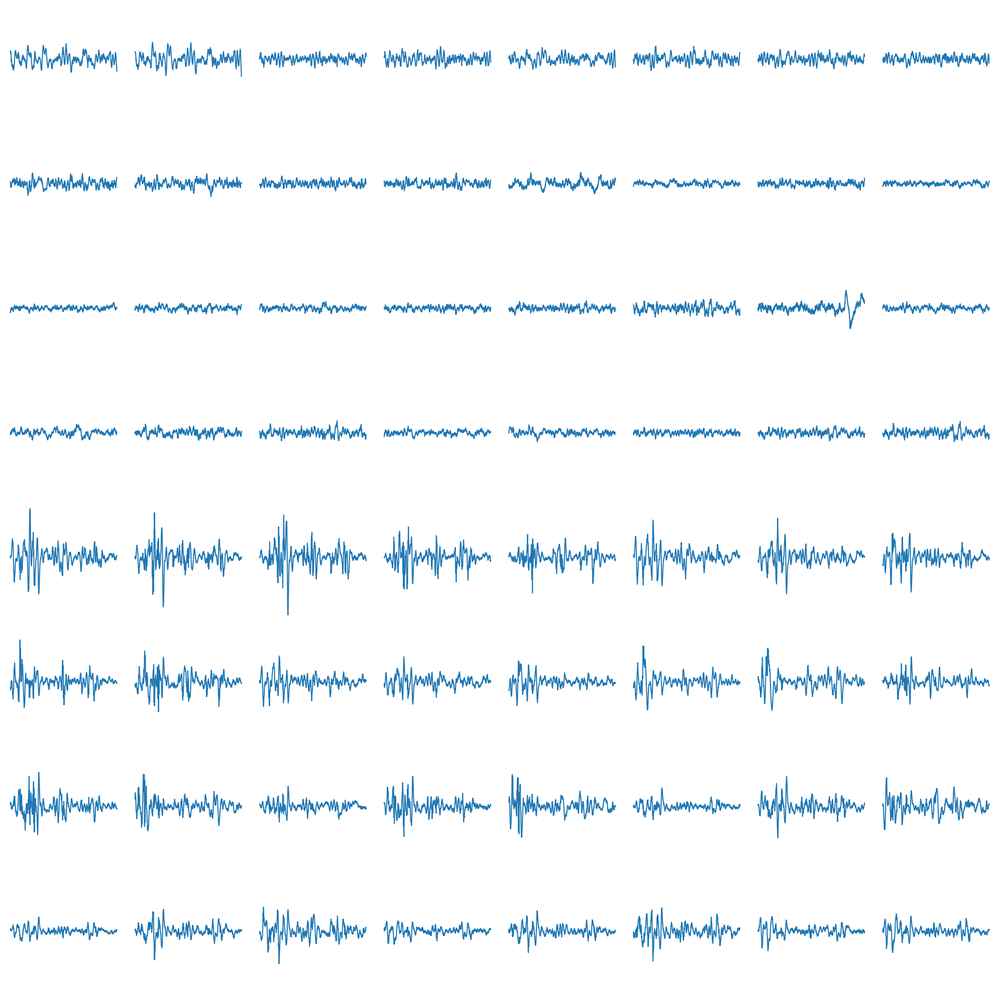

In [512]:
import matplotlib.pyplot as plt

# Assuming key_windows is already defined and contains the data
num_windows = blank_windows.shape[0]
time_points = blank_windows.shape[1]
num_channels = blank_windows.shape[2]

# Specify the window index to plot
window_index = np.random.randint(0, num_windows)  # Change this index to plot a different window
print(window_index)

# Create a figure with 8 by 8 subplots
fig, axes = plt.subplots(8, 8, figsize=(20, 20), sharex=True, sharey=True)

# Plot each channel for the specified window
for channel in range(num_channels):
    row = channel // 8
    col = channel % 8
    ax = axes[row, col]
    
    # Plot the signal for the current channel in the specified window
    ax.plot(blank_windows[window_index, :, channel])
    
    # ax.set_title(f'Channel {channel}')
    ax.axis('off')  # Turn off the axis if desired

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()

In [515]:
blank_labels = np.zeros(blank_idxs.size)
blank_labels.shape

(2097,)

In [516]:
key_windows.shape, blank_windows.shape, y.shape, blank_labels.shape

((699, 1600, 64), (2097, 1600, 64), (699,), (2097,))

In [517]:
(window_pre + window_post - subwindow_len) // 2

560

In [518]:
(800 + 800 - 480) // 2

560

In [550]:
key_windows.shape, blank_windows.shape, y.shape, blank_labels.shape

((699, 1600, 64), (2097, 1600, 64), (699,), (2097,))

In [552]:
full_windows = np.concatenate((key_windows, blank_windows))
y = np.concatenate((y, blank_labels))
full_windows.shape, y.shape

((2796, 1600, 64), (2796,))

In [557]:
temp = (window_pre + window_post - subwindow_len)//2
temp

560

In [640]:
X = np.copy(full_windows[:, temp:temp + subwindow_len, :])
X.shape

(2796, 480, 64)

300


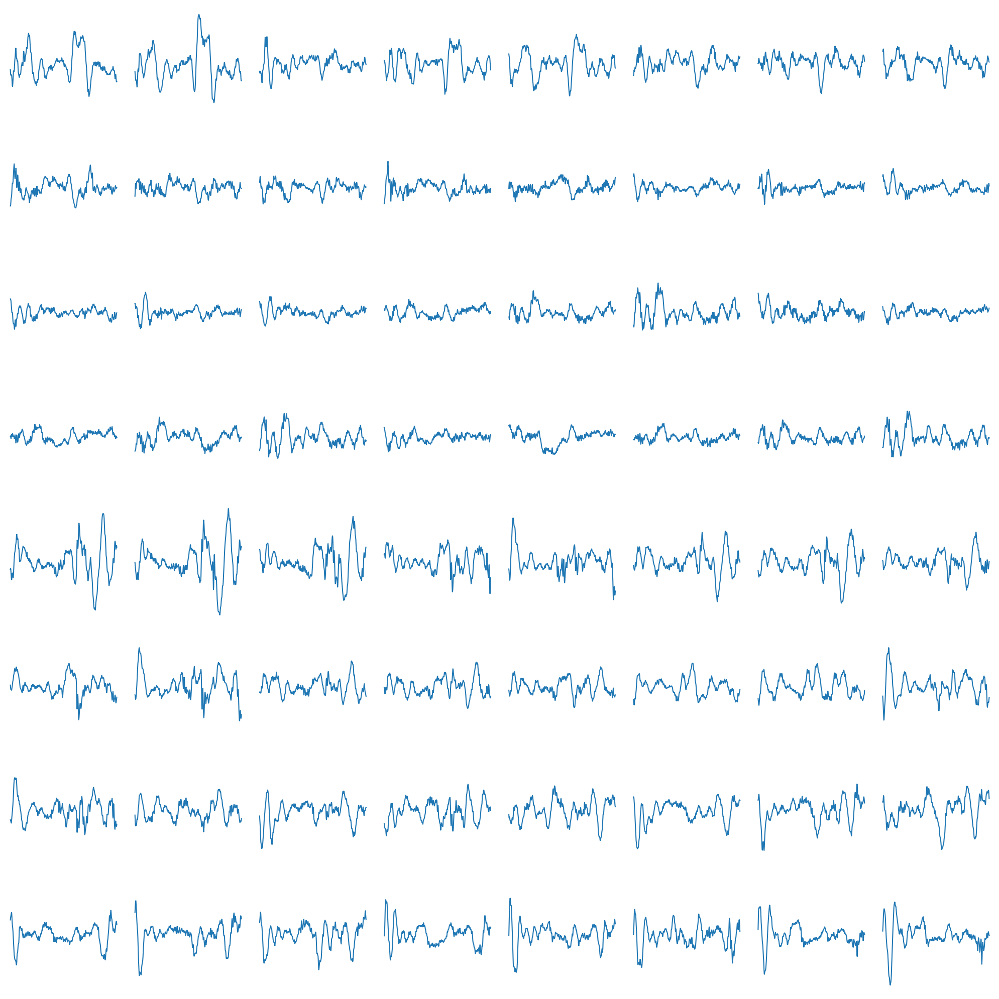

In [571]:
# Assuming key_windows is already defined and contains the data
num_windows = X.shape[0]
time_points = X.shape[1]
num_channels = X.shape[2]

# Specify the window index to plot
window_index = 300 # np.random.randint(0, num_windows)  # Change this index to plot a different window
print(window_index)

# Create a figure with 8 by 8 subplots
fig, axes = plt.subplots(8, 8, figsize=(20, 20), sharex=True, sharey=True)

# Plot each channel for the specified window
for channel in range(num_channels):
    row = channel // 8
    col = channel % 8
    ax = axes[row, col]
    
    # Plot the signal for the current channel in the specified window
    ax.plot(X[window_index, :, channel])
    
    # ax.set_title(f'Channel {channel}')
    ax.axis('off')  # Turn off the axis if desired

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()

In [576]:
start_idxs = np.ones(full_windows.shape[0]).astype(int)
start_idxs[:] = temp
start_idxs, start_idxs.shape

(array([560, 560, 560, ..., 560, 560, 560]), (2796,))

In [577]:
y

array([1., 1., 1., ..., 0., 0., 0.])

In [582]:
(window_pre + window_post) // 2 - subwindow_len//2, (window_pre+window_post)//2 + subwindow_len//2

(560, 1040)

In [581]:
560 + 480

1040

In [400]:
(480 / 4000) * 1000

120.0

In [583]:
full_windows.shape[0]

2796

In [589]:
i = 5
np.abs(full_windows[i, subwindow_len//2:-subwindow_len//2, :]).shape

(1120, 64)

In [592]:
np.mean(np.abs(full_windows[i, subwindow_len//2:-subwindow_len//2, :]), axis=-1).shape

(1120,)

In [635]:
i = 40
cur_avg = np.mean(np.abs(full_windows[i, subwindow_len//2:-subwindow_len//2, :]),axis=-1)
start_idx = subwindow_len//2 + np.argmax(cur_avg)
start_idx


np.int64(899)

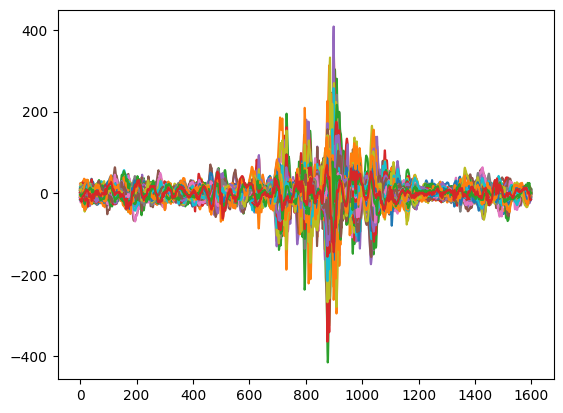

In [636]:
plt.plot(full_windows[i,...]);

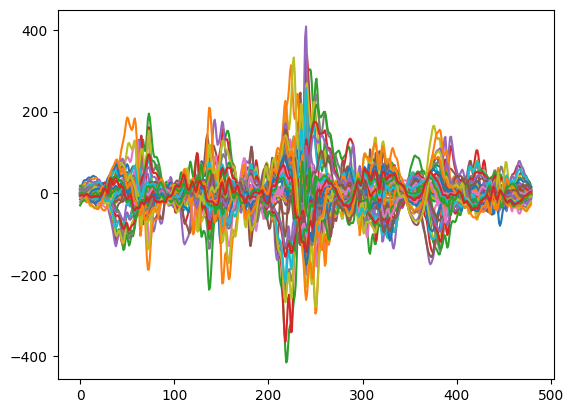

In [637]:
plt.plot(full_windows[i, start_idx-subwindow_len//2:start_idx+subwindow_len//2, :]);

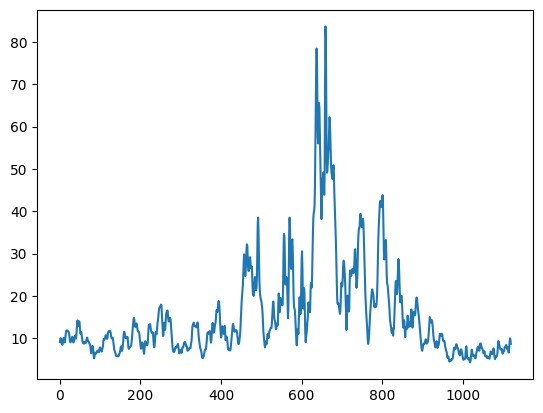

In [638]:
plt.plot(cur_avg)

In [641]:
for i in range(full_windows.shape[0]):
    if(binary==False or (binary==True and y[i] != 0)):
        cur_avg = np.mean(np.abs(full_windows[i, subwindow_len//2:-subwindow_len//2, :]), axis=-1)
        start_idx = subwindow_len//2 + np.argmax(cur_avg)
        X[i] = full_windows[i, start_idx-subwindow_len//2:start_idx + subwindow_len//2, :]
        start_idxs[i] = start_idx
    else:
        X[i] = full_windows[i, (window_pre + window_post)//2 - subwindow_len//2:(window_pre + window_post)//2 + subwindow_len//2 , :]

In [643]:
X.shape, y.shape

((2796, 480, 64), (2796,))

In [657]:
3//3

1

[ 90  55 443 254 636 663 527 563 580  28 636 538]


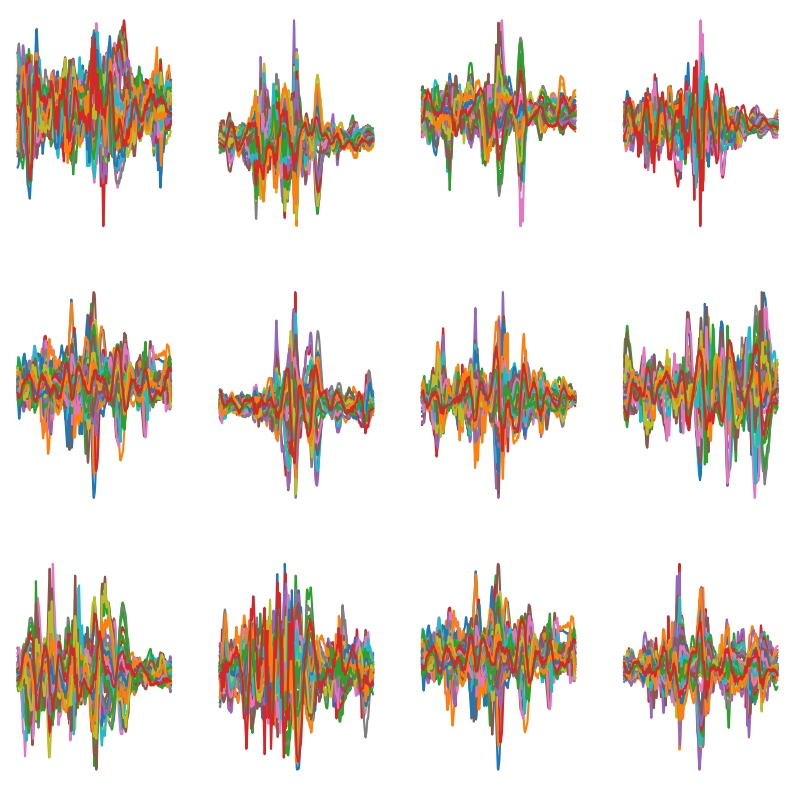

In [664]:
# non-blank
idx = np.random.randint(0,699, 12)
print(idx)

fig, axes = plt.subplots(3, 4, figsize=(10,10))

for i in range(len(idx)):
    row = i // 4
    col = i % 4
    ax = axes[row, col]

    ax.plot(X[idx[i],...]);
    ax.axis('off')

[1435 2613 1318  877 1087 1565 1930 1832 2370  879 2150 1616]


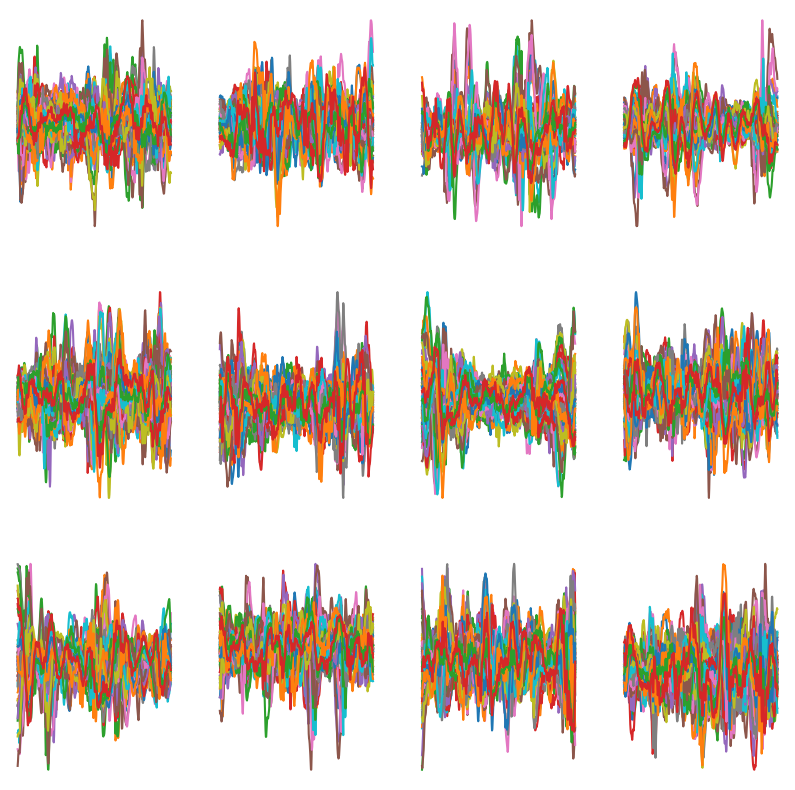

In [665]:
# blank
idx = np.random.randint(700,2796, 12)
print(idx)

fig, axes = plt.subplots(3, 4, figsize=(10,10))

for i in range(len(idx)):
    row = i // 4
    col = i % 4
    ax = axes[row, col]

    ax.plot(X[idx[i],...]);
    ax.axis('off')

In [660]:
X.shape

(2796, 480, 64)

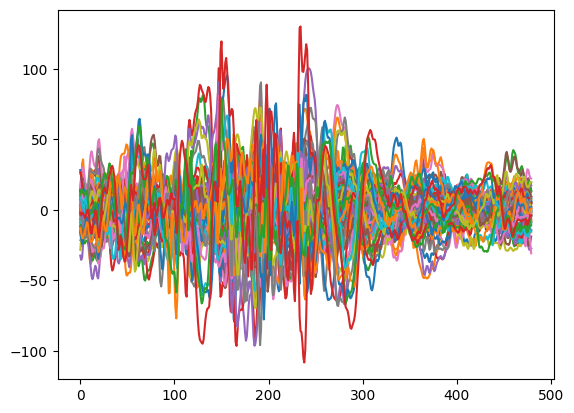

In [649]:
i = 300
plt.plot(X[i, ...]);

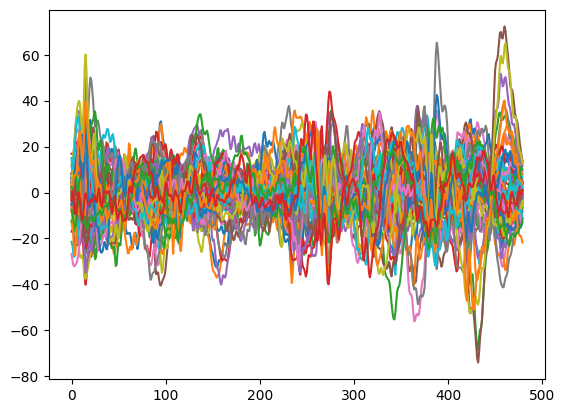

In [650]:
i = 1700
plt.plot(X[i, ...]);

In [617]:
if isinstance(layout[0], list):
    layout = [item for sublist in layout for item in sublist]

layout

['q',
 'w',
 'e',
 'r',
 't',
 'y',
 'u',
 'i',
 'o',
 'p',
 'a',
 's',
 'd',
 'f',
 'g',
 'h',
 'j',
 'k',
 'l',
 'z',
 'x',
 'c',
 'v',
 'b',
 'n',
 'm',
 ' ',
 '\x00']

In [618]:
key_conditions = []
for key in layout:
    if type(key) == str:
        key_code = ord(key)
    elif type(key) == int:
        key_code = key
    else:
        raise ValueError
    key_conditions.append(new_key_data['keybuffer'][:, 2] == key_code)

clean_bools = key_conditions[0]
for i in range(1, len(key_conditions)):
    clean_bools = np.logical_or(clean_bools , key_conditions[i])

new_key_data[clean_bools]

array([([                  0, 1727385568420319942,                  97],   14683,   0, 1727385568423831865),
       ([                  0, 1727385569217687101,                  97],   17882,   1, 1727385569218900553),
       ([                  0, 1727385570015092953,                 101],   21082,   2, 1727385570019081272),
       ([                  0, 1727385570812017017,                 104],   24281,   3, 1727385570814147296),
       ([                  0, 1727385571620063351,                 100],   27481,   4, 1727385571623853093),
       ([                  0, 1727385572428477191,                  97],   30748,   5, 1727385572428930503),
       ([                  0, 1727385573240923328,                 103],   34015,   6, 1727385573244200126),
       ([                  0, 1727385574055728232,                 104],   37281,   7, 1727385574058988840),
       ([                  0, 1727385574865426129,                  98],   40481,   8, 1727385574868824788),
       ([          

In [619]:
np.unique(new_key_data['keybuffer'][:, 2], return_counts=True)

(array([ 97,  98, 100, 101, 102, 103, 104]),
 array([100, 100, 100, 100, 100, 100, 100]))

In [620]:
np.unique(new_key_data[clean_bools]['keybuffer'][:, 2], return_counts=True)

(array([ 97,  98, 100, 101, 102, 103, 104]),
 array([100, 100, 100, 100, 100, 100, 100]))

In [621]:
[chr(a) for a in np.unique(new_key_data[clean_bools]['keybuffer'][:, 2])]

['a', 'b', 'd', 'e', 'f', 'g', 'h']

In [622]:
len(clean_bools)

700

In [623]:
len(key_conditions)

28

In [624]:
np.sum(clean_bools)

np.int64(700)

In [625]:
np.sum(new_key_data['keybuffer'][:, 2] == 97)

np.int64(100)

In [626]:
for i in range(data.shape[1]):
    plt.subplot(8, 8, i+1)
    plt.plot(data[1000:10000, i])
    plt.axis('off')
plt.show()

IndexError: tuple index out of range

In [209]:
np.mean(data[:,0:32], axis=1).shape

(2287325,)

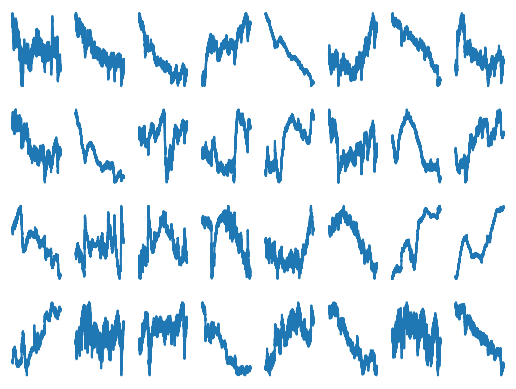

In [212]:
for i in range(32):
    plt.subplot(4, 8, i+1)
    plt.plot(data[:, i])
    plt.axis('off')
plt.show()

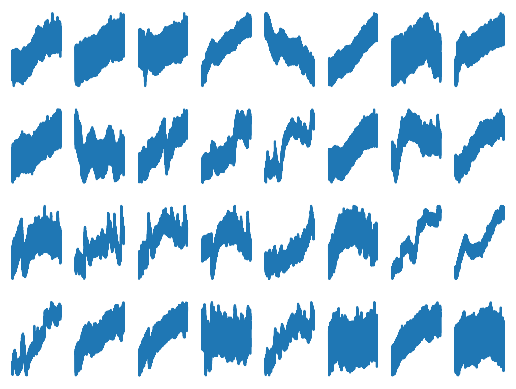

In [206]:
for i in range(32):
    plt.subplot(4, 8, i+1)
    plt.plot(data[:, i])
    plt.axis('off')
plt.show()

In [180]:
plt.plot(emg_buffer[:,1])
plt.show()

<IPython.core.display.Javascript object>

In [172]:
emg_stream.shape

(2287325, 67)

In [170]:
fn, qs, fc, fs

([60, 120, 180, 60, 300, 240], [10, 5, 2, 4, 2, 2], (10, 1000), 4000)

In [140]:
emg_stream.shape

(2287325, 67)

### EMG data visualiztion

ValueError: num must be an integer with 1 <= num <= 64, not 65

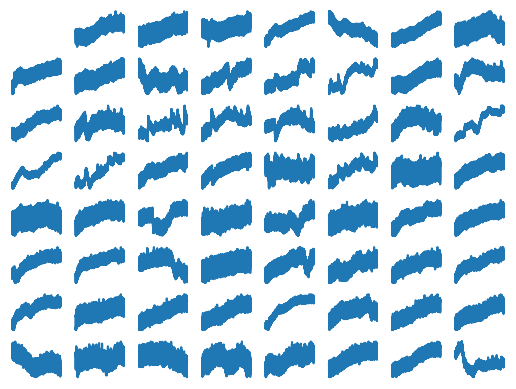

In [166]:
# plot emg_stream. each row is a channel. flexibly select which channels to plot
import matplotlib.pyplot as plt
# plt.plot(emg_stream[:, 50]);
# plot each channel as a subplot
for i in range(1, emg_stream.shape[1]-2):
    plt.subplot(8, 8, i+1)
    plt.plot(emg_stream[:, i])
    plt.axis('off')
plt.show()





In [ ]:
# write the code to plot the emg data in real time

In [168]:
from matplotlib.animation import FuncAnimation

import matplotlib.pyplot as plt



# Define the initial range to plot
start, end = 10000, 70000
channels = slice(1, 5)  # Select channels to plot

# Create the figure and axis
fig, ax = plt.subplots()
plt.subplots_adjust(bottom=0.25)

# Plot the initial data
lines = ax.plot(emg_stream[start:end, channels])
ax.set_title('EMG Data - Channels 1 to 4')
ax.set_xlabel('Time Points')
ax.set_ylabel('Amplitude')

# Create the slider axis and slider
ax_slider = plt.axes([0.2, 0.1, 0.65, 0.03], facecolor='lightgoldenrodyellow')
slider = Slider(ax_slider, 'Scroll', 0, emg_stream.shape[0] - (end - start), valinit=start, valstep=1)

# Update function for the animation
def update(val):
    pos = int(slider.val)
    for line, channel in zip(lines, range(channels.start, channels.stop)):
        line.set_ydata(emg_stream[pos:pos + (end - start), channel])
        line.set_xdata(range(pos, pos + (end - start)))
    ax.set_xlim(pos, pos + (end - start))
    fig.canvas.draw_idle()

# Attach the update function to the slider
slider.on_changed(update)

# Create the animation
ani = FuncAnimation(fig, update, interval=100)

plt.show()

<IPython.core.display.Javascript object>

/var/folders/sz/gk2spb8j48nd7k74nz3bmv8w0000gn/T/ipykernel_7238/231973014.py:38: UserWarning: frames=None which we can infer the length of, did not pass an explicit *save_count* and passed cache_frame_data=True.  To avoid a possibly unbounded cache, frame data caching has been disabled. To suppress this warning either pass `cache_frame_data=False` or `save_count=MAX_FRAMES`.
  ani = FuncAnimation(fig, update, interval=100)
/Users/abhishekmishra/anaconda3/envs/emg/lib/python3.12/site-packages/matplotlib/animation.py:872: UserWarning: Animation was deleted without rendering anything. This is most likely not intended. To prevent deletion, assign the Animation to a variable, e.g. `anim`, that exists until you output the Animation using `plt.show()` or `anim.save()`.
  warnings.warn(


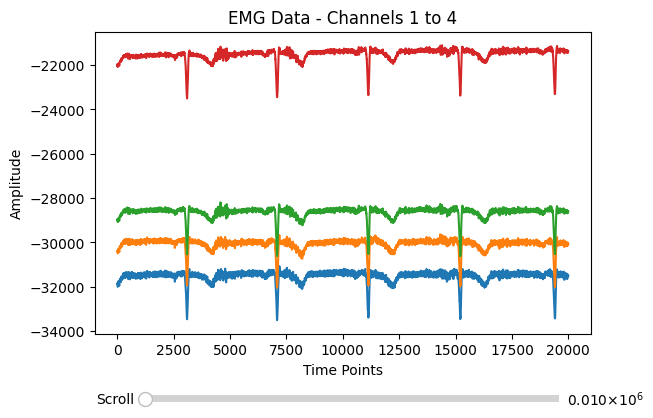

In [151]:
# plot emg_stream. each row is a channel. flexibly select which channels to plot
import matplotlib.pyplot as plt
from matplotlib.widgets import Slider

# Define the initial range to plot
start, end = 10000, 30000
channels = slice(1, 5)  # Select channels to plot

# Create the figure and axis
fig, ax = plt.subplots()
plt.subplots_adjust(bottom=0.25)

# Plot the initial data
lines = ax.plot(emg_stream[start:end, channels])
ax.set_title('EMG Data - Channels 1 to 4')
ax.set_xlabel('Time Points')
ax.set_ylabel('Amplitude')

# Create the slider axis and slider
ax_slider = plt.axes([0.2, 0.1, 0.65, 0.03], facecolor='lightgoldenrodyellow')
slider = Slider(ax_slider, 'Scroll', 0, emg_stream.shape[0] - (end - start), valinit=start, valstep=1)

# Update function for the slider
def update(val):
    pos = int(slider.val)
    for line, channel in zip(lines, range(channels.start, channels.stop)):
        line.set_ydata(emg_stream[pos:pos + (end - start), channel])
        line.set_xdata(range(pos, pos + (end - start)))
    ax.set_xlim(pos, pos + (end - start))
    fig.canvas.draw_idle()

# Attach the update function to the slider
slider.on_changed(update)

plt.show()

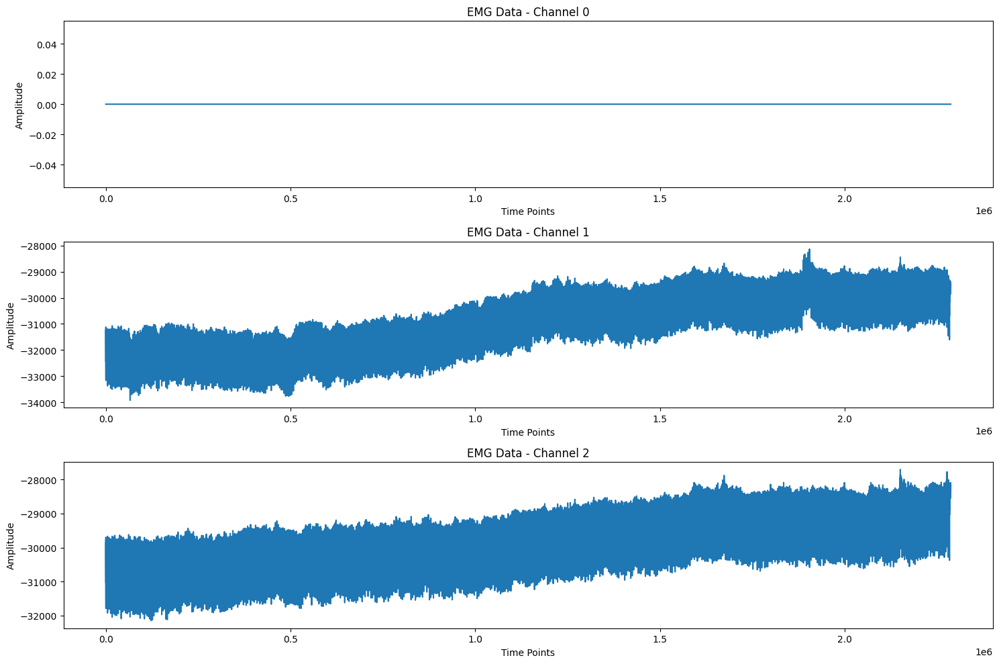

In [145]:
import matplotlib.pyplot as plt
import numpy as np
# Select a few channels to plot, e.g., channels 0, 1, and 2
channels_to_plot = [0, 1, 2]

plt.figure(figsize=(15, 10))
for i, channel in enumerate(channels_to_plot):
    plt.subplot(len(channels_to_plot), 1, i + 1)
    plt.plot(emg_stream[:, channel])
    plt.title(f'EMG Data - Channel {channel}')
    plt.xlabel('Time Points')
    plt.ylabel('Amplitude')

plt.tight_layout()
plt.show()

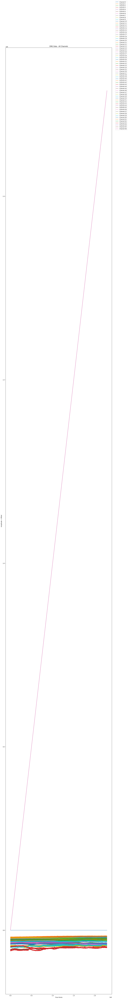

In [142]:


# Assuming emg_stream is already defined and contains the EMG data
num_channels = emg_stream.shape[1]
time_points = emg_stream.shape[0]

# Create an offset for each channel to separate them vertically
offset = 10  # Adjust this value as needed for better separation
y_offsets = np.arange(num_channels) * offset

# Create a figure
plt.figure(figsize=(15, 2 * num_channels))

# Plot each channel with an offset
for i in range(num_channels):
    plt.plot(emg_stream[:, i] + y_offsets[i], label=f'Channel {i}')

# Add labels and title
plt.xlabel('Time Points')
plt.ylabel('Amplitude + Offset')
plt.title('EMG Data - All Channels')
plt.legend(loc='upper right', bbox_to_anchor=(1.15, 1.05))

# Show the plot
plt.show()

In [144]:
emg_stream[0]

array([ 0.00000000e+00, -3.12771425e+04, -2.98620705e+04, -2.83659380e+04,
       -2.15787143e+04, -3.48960906e+04, -4.15940173e+04, -2.06390973e+04,
       -2.86590345e+04, -2.81327572e+04, -2.48807818e+04, -2.18146760e+04,
       -3.25950608e+04, -5.46841025e+04, -2.63776965e+04, -3.12272292e+04,
       -2.46733855e+04, -3.66491862e+04, -4.56966758e+04, -4.43375148e+04,
       -3.71466614e+04, -2.78587732e+04, -3.02116070e+04, -5.38566224e+04,
       -3.25205289e+04, -5.14647141e+04, -3.12166642e+04, -2.50068828e+04,
       -4.12970670e+04, -4.57327664e+04, -2.60290336e+04, -2.01299675e+04,
       -2.92010028e+04, -2.00285409e+04, -2.39471663e+04, -2.34986413e+04,
       -2.31966916e+04, -1.92203894e+04, -2.57036816e+04, -2.18998101e+04,
       -2.19102837e+04, -2.61056572e+04, -3.29674520e+04, -1.95971075e+04,
       -2.14476120e+04, -2.80990824e+04, -2.14963797e+04, -2.53393445e+04,
       -3.42158750e+04, -1.97939053e+04, -2.00113934e+04, -2.70031076e+04,
       -3.52929197e+04, -

In [135]:
emg_data['emgbuffer'].shape

(2287325, 67)

In [133]:
new_key_data

array([([                  0, 1727385568420319942,                  97],   14683,   0, 1727385568423831865),
       ([                  0, 1727385569217687101,                  97],   17882,   1, 1727385569218900553),
       ([                  0, 1727385570015092953,                 101],   21082,   2, 1727385570019081272),
       ([                  0, 1727385570812017017,                 104],   24281,   3, 1727385570814147296),
       ([                  0, 1727385571620063351,                 100],   27481,   4, 1727385571623853093),
       ([                  0, 1727385572428477191,                  97],   30748,   5, 1727385572428930503),
       ([                  0, 1727385573240923328,                 103],   34015,   6, 1727385573244200126),
       ([                  0, 1727385574055728232,                 104],   37281,   7, 1727385574058988840),
       ([                  0, 1727385574865426129,                  98],   40481,   8, 1727385574868824788),
       ([          

In [131]:
key_data

array([([1727385568420319942,                  97],   14683,   0, 1727385568423831865),
       ([1727385569217687101,                  97],   17882,   1, 1727385569218900553),
       ([1727385570015092953,                 101],   21082,   2, 1727385570019081272),
       ([1727385570812017017,                 104],   24281,   3, 1727385570814147296),
       ([1727385571620063351,                 100],   27481,   4, 1727385571623853093),
       ([1727385572428477191,                  97],   30748,   5, 1727385572428930503),
       ([1727385573240923328,                 103],   34015,   6, 1727385573244200126),
       ([1727385574055728232,                 104],   37281,   7, 1727385574058988840),
       ([1727385574865426129,                  98],   40481,   8, 1727385574868824788),
       ([1727385575670318230,                 102],   43680,   9, 1727385575673909050),
       ([1727385576479309742,                 101],   46947,  10, 1727385576484103688),
       ([1727385577275728706,   

In [121]:
key_data['keybuffer'][:,1:2].shape

(700, 1)

In [103]:
set([chr(i) for i in key_data['keybuffer'][:80, 1]])

{'a', 'b', 'd', 'e', 'f', 'g', 'h'}

In [104]:
key_data['keybuffer'][:,1]

array([ 97,  97, 101, 104, 100,  97, 103, 104,  98, 102, 101,  98, 103,
        98, 103, 103,  98,  98, 103, 102, 101, 102, 103, 104,  97, 103,
        97,  97,  97, 104,  98, 102,  97,  98,  97, 104, 100, 103, 102,
       104, 104, 103,  98, 100, 102, 104, 100,  98, 101, 104, 104, 102,
       104, 103,  98,  98, 101,  97, 100, 100, 100, 101, 102, 102, 103,
       103, 102, 100, 104,  98,  98, 103, 102,  97, 103,  98, 103, 102,
       100, 102, 104, 100, 101, 100, 101, 101, 103,  97,  98, 102, 102,
        97, 101, 102, 104, 100, 103,  98,  97,  98, 100,  97, 100, 101,
       100, 101, 104, 100,  98, 101, 100, 102,  97,  98, 103,  97,  98,
        97,  97, 100, 103,  97, 100, 102,  98, 104,  97, 101, 100,  97,
        98, 100, 104, 104,  98, 103, 103, 100, 102, 100, 102, 103, 103,
       101,  97, 103,  98, 104,  97, 104, 101, 101, 101, 103, 102, 100,
       103, 100,  97, 102, 104, 101, 101, 101, 103, 102, 102,  97,  97,
       104, 104,  98, 101, 102,  97, 100,  97, 103, 104, 100,  9

In [105]:
np.unique(key_data['keybuffer'][:,1], return_counts=True)

(array([ 97,  98, 100, 101, 102, 103, 104]),
 array([100, 100, 100, 100, 100, 100, 100]))

In [58]:
data['emgbuffer'][4]

array([ 0.00000000e+00, -3.13348360e+04, -2.99168024e+04, -2.84044873e+04,
       -2.16111708e+04, -3.49323116e+04, -4.16164920e+04, -2.06715893e+04,
       -2.86935810e+04, -2.81612147e+04, -2.49122940e+04, -2.18430422e+04,
       -3.26216631e+04, -5.47176860e+04, -2.64149532e+04, -3.12482491e+04,
       -2.46995501e+04, -3.66758630e+04, -4.57267687e+04, -4.43617180e+04,
       -3.71755734e+04, -2.78777387e+04, -3.02303713e+04, -5.38707338e+04,
       -3.25454921e+04, -5.14916070e+04, -3.12324110e+04, -2.50293389e+04,
       -4.13269065e+04, -4.57677171e+04, -2.60560364e+04, -2.01509874e+04,
       -2.92284768e+04, -2.00510696e+04, -2.39715688e+04, -2.35223696e+04,
       -2.32167281e+04, -1.92479175e+04, -2.57248469e+04, -2.19120290e+04,
       -2.19393596e+04, -2.61255857e+04, -3.29909436e+04, -1.96226556e+04,
       -2.14808509e+04, -2.81271748e+04, -2.15131082e+04, -2.53590364e+04,
       -3.42364758e+04, -1.98132154e+04, -2.00263597e+04, -2.70209275e+04,
       -3.53108495e+04, -

In [67]:
data['emg_stream_step']

array([     32,      32,      32, ..., 2287324, 2287324, 2287324])

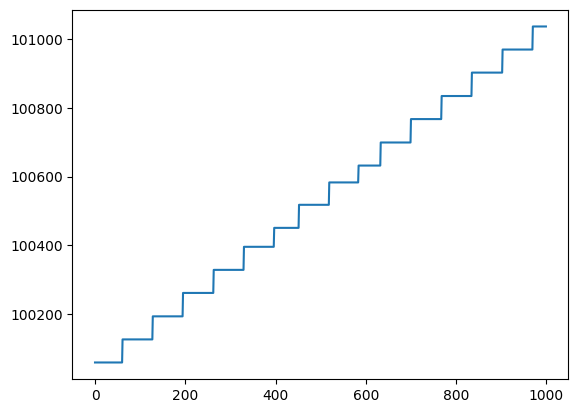

In [66]:
import matplotlib.pyplot as plt
plt.plot(data['emg_stream_step'][100000:101000]);

In [68]:
data['key_stream_step']

array([ -1,  -1,  -1, ..., 699, 699, 699])

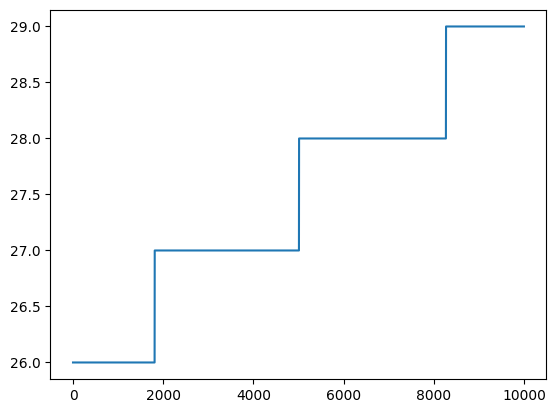

In [74]:
plt.plot(data['key_stream_step'][100000:110000])

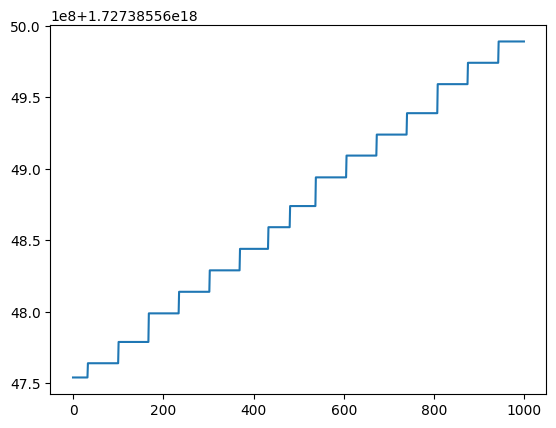

In [79]:
plt.plot(data['time_ns'][:1000])

In [45]:
data_dict

{'keybuffer': array([[1727385568420319942,                  97],
        [1727385569217687101,                  97],
        [1727385570015092953,                 101],
        ...,
        [1727386130893905297,                  97],
        [1727386131702616075,                 102],
        [1727386132509912208,                 103]]),
 'emg_stream_step': array([  14683,   17882,   21082,   24281,   27481,   30748,   34015,
          37281,   40481,   43680,   46947,   50147,   53366,   56613,
          59880,   63080,   66347,   69546,   72813,   76013,   79212,
          82470,   85679,   88926,   92069,   95344,   98544,  101809,
         105044,  108269,  111510,  114717,  117977,  121176,  124443,
         127643,  130842,  134109,  137309,  140576,  143775,  147042,
         150309,  153509,  156775,  159975,  163174,  166374,  169574,
         172840,  176040,  179307,  182506,  185773,  188973,  192220,
         195494,  198639,  201879,  205081,  208305,  211538,  214769,
  

In [40]:
data['emg_stream_step'].shape

(700,)

In [33]:
# check the datatype of the data
print(data.dtype)

[('keybuffer', '<i8', (2,)), ('emg_stream_step', '<i8'), ('key_stream_step', '<i8'), ('time_ns', '<i8')]


In [34]:
data

array([([1727385568420319942,                  97],   14683,   0, 1727385568423831865),
       ([1727385569217687101,                  97],   17882,   1, 1727385569218900553),
       ([1727385570015092953,                 101],   21082,   2, 1727385570019081272),
       ([1727385570812017017,                 104],   24281,   3, 1727385570814147296),
       ([1727385571620063351,                 100],   27481,   4, 1727385571623853093),
       ([1727385572428477191,                  97],   30748,   5, 1727385572428930503),
       ([1727385573240923328,                 103],   34015,   6, 1727385573244200126),
       ([1727385574055728232,                 104],   37281,   7, 1727385574058988840),
       ([1727385574865426129,                  98],   40481,   8, 1727385574868824788),
       ([1727385575670318230,                 102],   43680,   9, 1727385575673909050),
       ([1727385576479309742,                 101],   46947,  10, 1727385576484103688),
       ([1727385577275728706,   

In [27]:
list(zip(labels, dtypes))

[('keybuffer', '2<i8'),
 ('emg_stream_step', 'int64'),
 ('key_stream_step', 'int64'),
 ('time_ns', 'int64')]

In [18]:
# explore the emg_stream.bin file
filename = emg_fname 
encoding: str = 'utf-8'
return_dict: bool = False

with open(filename, 'rb') as openfile:
    name = openfile.readline().decode(encoding).strip() # a string identifier for the data
    labels = openfile.readline().decode(encoding).strip() # a comma separated string of labels for the data columns
    dtypes = openfile.readline().decode(encoding).strip() # a comma-separated string of data types for the columns. It may also contain shapes.capitalize
    shapes = None
    print(name); print(labels); print(dtypes); print(shapes)

emg_stream
emgbuffer,emg_stream_step,key_stream_step,time_ns
67<f8,int64,int64,int64
None
